# **Homework 8 - Anomaly Detection**

If there are any questions, please contact ntu-ml-2021spring-ta@googlegroups.com

In [55]:
%reset -f

In [56]:
# !ps
# !kill 58

#GPU & RAM

In [57]:
# check if using a good GPU(P100 or V100)
gpu_info = !nvidia-smi
gpu_info = "\n".join(gpu_info)
if gpu_info.find("failed") >= 0:
  print("Select the Runtime > 'Change runtime type' menu to enable a GPU accelerator, ")
  print("and then re-execute this cell.")
else:
  print(gpu_info)

# check if using high-RAM
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print("Your runtime has {:.1f} gigabytes of available RAM\n".format(ram_gb))

if ram_gb < 20:
  print("To enable a high-RAM runtime, select the Runtime > 'Change runtime type'")
  print("menu, and then select High-RAM in the Runtime shape dropdown. Then, ")
  print("re-execute this cell.")
else:
  print("You are using a high-RAM runtime!")

Sat May  8 02:52:38 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.19.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P0    39W / 300W |   2945MiB / 16160MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Mounting your gdrive (Optional)
By mounting your gdrive, you can save and manage your data and models in your Google drive

In [58]:
from google.colab import drive
drive.mount('/content/gdrive')

# your workspace in your drive
workspace = './gdrive/MyDrive/ColabNotebooks/HW8'


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


# Set up the environment


## Untar data

data-bin contains 2 files
```
data-bin/
├── trainingset.npy
├── testingset.npy
...
```

In [59]:
# !tar zxvf {workspace}/data-bin.tar.gz
# !mv data-bin/ {workspace}/data-bin
# %ls {workspace}/data-bin

## Package installation

In [60]:
# Training progress bar
!pip install -q qqdm

# Import packages

In [61]:
import numpy as np
import random
import torch

from torch.utils.data import DataLoader
from torch.utils.data import (DataLoader, RandomSampler, SequentialSampler, TensorDataset)
import torchvision.transforms as transforms

from torch import nn
import torch.nn.functional as F
from torch.autograd import Variable
import torchvision.models as models

from torch.optim import Adam, AdamW

from sklearn.cluster import MiniBatchKMeans
from scipy.cluster.vq import vq, kmeans

# from qqdm import qqdm, format_str
from qqdm.notebook import qqdm
import pandas as pd

import pdb  # use pdb.set_trace() to set breakpoints for debugging




# Loading data

In [62]:
train = np.load(f'{workspace}/data-bin/trainingset.npy', allow_pickle=True)
test = np.load(f'{workspace}/data-bin/testingset.npy', allow_pickle=True)

print(train.shape)
print(test.shape)

(140001, 64, 64, 3)
(19999, 64, 64, 3)


# Show images

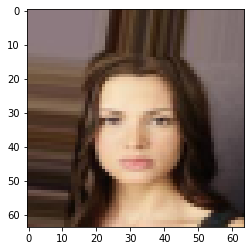

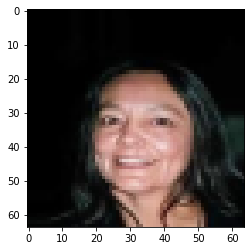

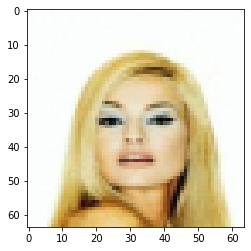

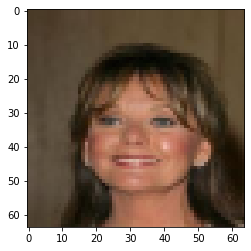

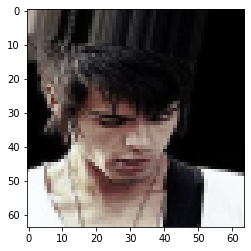

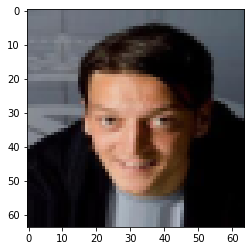

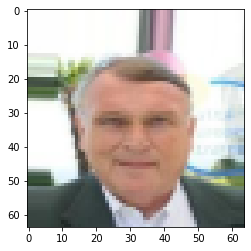

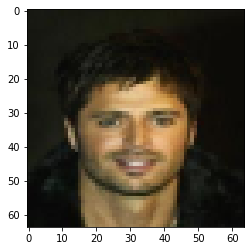

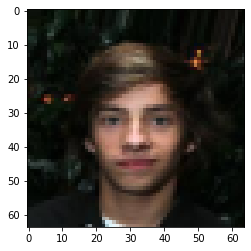

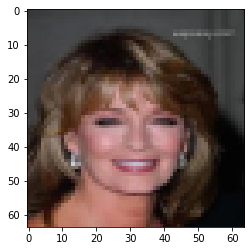

In [63]:
tensor_to_PIL = transforms.ToPILImage()
from matplotlib.pyplot import imshow
from matplotlib import pyplot as plt
import random

%matplotlib inline
for i in range(10):
    idx = random.randint(0, 19999)
    img = train[idx]
    b, g, r = img[:, :, 0], img[:, :, 1], img[:, :, 2]
    img = np.stack((r, g, b), axis=-1)

    # p = 0.05
    # mask = np.random.choice(a=[True, False], size=img.shape, p=[p, 1-p])
    # img[mask] = np.random.randint(0, 256)

    img = tensor_to_PIL(img).convert('RGB')
    imshow(img)
    plt.show()


## Random seed
Set the random seed to a certain value for reproducibility.

In [64]:
def same_seeds(seed):
    # Python built-in random module
    random.seed(seed)
    # Numpy
    np.random.seed(seed)
    # Torch
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

same_seeds(19530615)

# Autoencoder

# Models & loss

Lecture video：https://www.youtube.com/watch?v=6W8FqUGYyDo&list=PLJV_el3uVTsOK_ZK5L0Iv_EQoL1JefRL4&index=8

fcn_autoencoder and vae are from https://github.com/L1aoXingyu/pytorch-beginner

conv_autoencoder is from https://github.com/jellycsc/PyTorch-CIFAR-10-autoencoder/

In [65]:
class fcn_autoencoder(nn.Module):
    def __init__(self):
        super(fcn_autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(64 * 64 * 3, 128),
            nn.ReLU(True),
            nn.Linear(128, 64),
            nn.ReLU(True), 
            nn.Linear(64, 12), 
            nn.ReLU(True), 
            nn.Linear(12, 3))

        self.decoder = nn.Sequential(
            nn.Linear(3, 12),
            nn.ReLU(True),
            nn.Linear(12, 64),
            nn.ReLU(True),
            nn.Linear(64, 128),
            nn.ReLU(True), 
            nn.Linear(128, 64 * 64 * 3), 
            nn.Tanh())

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

class conv_block(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(conv_block, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, in_channels, 3, 1, 1),         
            nn.LeakyReLU(),
            nn.BatchNorm2d(in_channels),

            nn.Conv2d(in_channels, out_channels, 3, 1, 1),        
            nn.LeakyReLU(),
            nn.BatchNorm2d(out_channels),
        )

    def forward(self, x):
        return self.block(x)

class interpolate(nn.Module):
    def __init__(self, scale_factor=2, mode="nearest"):
        super(interpolate, self).__init__()
        self.scale_factor = scale_factor
        self.mode = mode

    def forward(self, x):
        return F.interpolate(x, scale_factor=self.scale_factor, mode=self.mode)

class conv_autoencoder(nn.Module):
    def __init__(self):
        super(conv_autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            # 3x64x64 = 12288
            nn.Conv2d(3, 16, 3, 1, 1),         
            nn.LeakyReLU(),
            nn.BatchNorm2d(16),
            # 16x64x64
            conv_block(16, 32),
            nn.MaxPool2d(2, 2, 0),
            # 32x32x32
            conv_block(32, 64),
            nn.MaxPool2d(2, 2, 0),
            # 64x16x16
            conv_block(64, 128),
            nn.MaxPool2d(2, 2, 0),
            # 128x8x8
            conv_block(128, 256),
            nn.MaxPool2d(2, 2, 0),
            # 256x4x4
            nn.Conv2d(256, 256, 3, 1, 1),        
            nn.LeakyReLU(),
            # 256x4x4
            nn.Conv2d(256, 256, 4, 1, 0),
            nn.LeakyReLU(),
            # 256x1x1            
        )

        self.decoder = nn.Sequential(
            # 256x1x1
            nn.ConvTranspose2d(256, 256, 4, 1, 0),
            nn.LeakyReLU(),
            # 256x4x4
            nn.Conv2d(256, 256, 3, 1, 1),
            nn.LeakyReLU(),
            # 256x4x4
            interpolate(),
            conv_block(256, 128),
            # 128x8x8
            interpolate(),
            conv_block(128, 64),
            # 64x16x16
            interpolate(),
            conv_block(64, 32),
            # 32x32x32
            interpolate(),
            conv_block(32, 16),
            # 16x64x64
            nn.Conv2d(16, 3, 3, 1, 1),
            # 3x64x64
            nn.Tanh(),
        )

    def forward(self, x):
        return self.decoder(self.encoder(x))

    def enc(self, x):
        return self.encoder(x)

    def dec(self, x):
        return self.decoder(x)

    def loss(self, x, x_noise):
        x_noise_enc = self.enc(x_noise)
        x_noise_enc_dec = self.dec(x_noise_enc)
        # x_noise_enc_dec_enc = self.enc(x_noise_enc_dec)
        # x_noise_enc_dec_enc_dec = self.dec(x_noise_enc_dec_enc)

        crit_l1 = nn.L1Loss(reduction='mean')
        crit_l2 = nn.MSELoss(reduction='mean')

        loss_list = [
            crit_l1(x, x_noise_enc_dec),
            # crit_l1(x, x_noise_enc_dec_enc_dec),
            crit_l2(x_noise_enc, torch.zeros_like(x_noise_enc)),
            # crit_l2(x_noise_enc_dec_enc, torch.zeros_like(x_noise_enc_dec_enc))
        ]

        return loss_list[0] + loss_list[1]# + loss_list[2] + loss_list[3]

class VAE(nn.Module):
    def __init__(self):
        super(VAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 12, 4, stride=2, padding=1),            
            nn.ReLU(),
            nn.Conv2d(12, 24, 4, stride=2, padding=1),    
            nn.ReLU(),
        )
        self.enc_out_1 = nn.Sequential(
            nn.Conv2d(24, 48, 4, stride=2, padding=1),  
            nn.ReLU(),
        )
        self.enc_out_2 = nn.Sequential(
            nn.Conv2d(24, 48, 4, stride=2, padding=1),
            nn.ReLU(),
        )
        self.decoder = nn.Sequential(
			      nn.ConvTranspose2d(48, 24, 4, stride=2, padding=1), 
            nn.ReLU(),
			      nn.ConvTranspose2d(24, 12, 4, stride=2, padding=1), 
            nn.ReLU(),
            nn.ConvTranspose2d(12, 3, 4, stride=2, padding=1), 
            nn.Tanh(),
        )

    def encode(self, x):
        h1 = self.encoder(x)
        return self.enc_out_1(h1), self.enc_out_2(h1)

    def reparametrize(self, mu, logvar):
        std = logvar.mul(0.5).exp_()
        if torch.cuda.is_available():
            eps = torch.cuda.FloatTensor(std.size()).normal_()
        else:
            eps = torch.FloatTensor(std.size()).normal_()
        eps = Variable(eps)
        return eps.mul(std).add_(mu)

    def decode(self, z):
        return self.decoder(z)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparametrize(mu, logvar)
        return self.decode(z), mu, logvar


def loss_vae(recon_x, x, mu, logvar, criterion):
    """
    recon_x: generating images
    x: origin images
    mu: latent mean
    logvar: latent log variance
    """
    mse = criterion(recon_x, x)  # mse loss
    KLD_element = mu.pow(2).add_(logvar.exp()).mul_(-1).add_(1).add_(logvar)
    KLD = torch.sum(KLD_element).mul_(-0.5)
    return mse + KLD


class Resnet(nn.Module):
    def __init__(self, fc_hidden1=1024, fc_hidden2=768, drop_p=0.3, CNN_embed_dim=256):
        super(Resnet, self).__init__()

        self.fc_hidden1, self.fc_hidden2, self.CNN_embed_dim = fc_hidden1, fc_hidden2, CNN_embed_dim

        # CNN architechtures
        self.ch1, self.ch2, self.ch3, self.ch4 = 16, 32, 64, 128
        self.k1, self.k2, self.k3, self.k4 = (5, 5), (3, 3), (3, 3), (3, 3)      # 2d kernal size
        self.s1, self.s2, self.s3, self.s4 = (2, 2), (2, 2), (2, 2), (2, 2)      # 2d strides
        self.pd1, self.pd2, self.pd3, self.pd4 = (0, 0), (0, 0), (0, 0), (0, 0)  # 2d padding

        # encoding components
        resnet = models.resnet18(pretrained=False)
        modules = list(resnet.children())[:-1]      # delete the last fc layer.
        self.resnet = nn.Sequential(*modules)
        self.fc1 = nn.Linear(resnet.fc.in_features, self.fc_hidden1)
        self.bn1 = nn.BatchNorm1d(self.fc_hidden1, momentum=0.01)
        self.fc2 = nn.Linear(self.fc_hidden1, self.fc_hidden2)
        self.bn2 = nn.BatchNorm1d(self.fc_hidden2, momentum=0.01)

        self.fc3_mu = nn.Linear(self.fc_hidden2, self.CNN_embed_dim)      # output = CNN embedding latent variables

        # Sampling vector
        self.fc4 = nn.Linear(self.CNN_embed_dim, self.fc_hidden2)
        self.fc_bn4 = nn.BatchNorm1d(self.fc_hidden2)
        self.fc5 = nn.Linear(self.fc_hidden2, 64 * 4 * 4)
        self.fc_bn5 = nn.BatchNorm1d(64 * 4 * 4)
        self.relu = nn.ReLU(inplace=True)

        # Decoder
        self.convTrans6 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=self.k4, stride=self.s4,
                               padding=self.pd4),
            nn.BatchNorm2d(32, momentum=0.01),
            nn.ReLU(inplace=True),
        )
        self.convTrans7 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=32, out_channels=8, kernel_size=self.k3, stride=self.s3,
                               padding=self.pd3),
            nn.BatchNorm2d(8, momentum=0.01),
            nn.ReLU(inplace=True),
        )

        self.convTrans8 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=8, out_channels=3, kernel_size=self.k2, stride=self.s2,
                               padding=self.pd2),
            nn.BatchNorm2d(3, momentum=0.01),
            nn.Sigmoid()    # y = (y1, y2, y3) \in [0 ,1]^3
        )


    def encode(self, x):
        x = self.resnet(x)  # ResNet
        x = x.view(x.size(0), -1)  # flatten output of conv

        # FC layers
        if x.shape[0] > 1:
            x = self.bn1(self.fc1(x))
        else:
            x = self.fc1(x)
        x = self.relu(x)
        if x.shape[0] > 1:
            x = self.bn2(self.fc2(x))
        else:
            x = self.fc2(x)
        x = self.relu(x)
        x = self.fc3_mu(x)
        return x

    def decode(self, z):
        if z.shape[0] > 1:
            x = self.relu(self.fc_bn4(self.fc4(z)))
            x = self.relu(self.fc_bn5(self.fc5(x))).view(-1, 64, 4, 4)
        else:
            x = self.relu(self.fc4(z))
            x = self.relu(self.fc5(x)).view(-1, 64, 4, 4)
        x = self.convTrans6(x)
        x = self.convTrans7(x)
        x = self.convTrans8(x)
        x = F.interpolate(x, size=(64, 64), mode='bilinear', align_corners=True)
        return x

    def forward(self, x):
        z = self.encode(x)
        x_reconst = self.decode(z)

        return x_reconst


# Dataset module

Module for obtaining and processing data. The transform function here normalizes image's pixels from [0, 255] to [-1.0, 1.0].


In [66]:
import random

class CustomTensorDataset(TensorDataset):
    """TensorDataset with support of transforms.
    """
    def __init__(self, imgs, prob=0.0):
        self.imgs = imgs

        self.norm = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
            ])
        
        self.prob = prob

    def __getitem__(self, index):
        img = self.imgs[index]

        img_noise = np.copy(img)
        p = self.prob * random.random()
        mask = np.random.choice(a=[True, False], size=img_noise.shape, p=[p, 1-p])
        img_noise[mask] = np.random.randint(0, 256)

        img = self.norm(img)
        img_noise = self.norm(img_noise)

        return img, img_noise

    def __len__(self):
        return len(self.imgs)

# Training

## Initialize
- hyperparameters
- dataloader
- model
- optimizer & loss


In [75]:
# Training hyperparameters
num_epochs = 50
batch_size = 128 # medium: smaller batchsize
learning_rate = 1e-4

# Build training dataloader
# train_dataset = CustomTensorDataset(train, prob=0.2) # score: 0.82846
train_dataset = CustomTensorDataset(train, prob=0.3) # score: 0.82808

train_sampler = RandomSampler(train_dataset)
train_dataloader = DataLoader(train_dataset, sampler=train_sampler, batch_size=batch_size)

# Model
model_type = 'cnn'   # selecting a model type from {'cnn', 'fcn', 'vae', 'resnet'}
model_classes = {'resnet': Resnet, 'fcn':fcn_autoencoder, 'cnn':conv_autoencoder, 'vae':VAE, }
model = model_classes[model_type]().cuda()

# # load trained model
# checkpoint_path = f'{workspace}/models/last_model_{model_type}_003.pt'
# model = torch.load(checkpoint_path)

# optimizer
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=len(train_dataset)//batch_size, eta_min=1e-6)

# fp16

In [68]:
!pip install accelerate==0.2.0
from accelerate import Accelerator
accelerator = Accelerator(fp16=True)
device = accelerator.device

## Training loop

In [69]:
tensor_to_PIL = transforms.ToPILImage()
from matplotlib.pyplot import imshow
from matplotlib import pyplot as plt

%matplotlib inline

def show_img(img):
    b, g, r = img[0, :, :], img[1, :, :], img[2, :, :]
    img = np.stack((r, g, b), axis=0)
    img = torch.Tensor(img)

    img_pil = tensor_to_PIL(img).convert('RGB')
    imshow(img_pil)
    plt.show()


   Iters      Elapsed Time      Speed    epoch     loss         lr              
 1094/1094  00:02:14<00:00:00  8.11it/s  1/50   0.08703963  0.00000100          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

img:


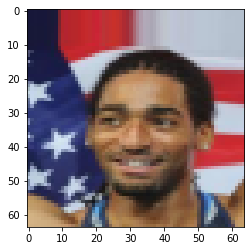

img_noise:


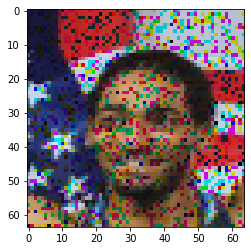

img_recon:


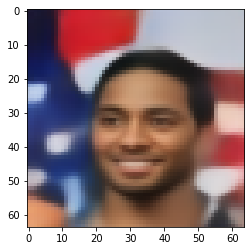

mes_loss: 0.12190614640712738
img:


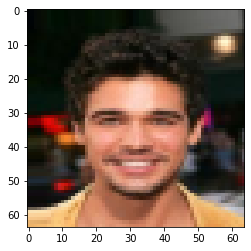

img_noise:


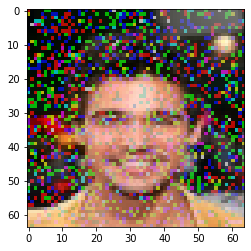

img_recon:


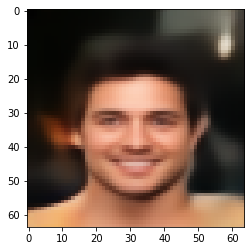

mes_loss: 0.09349650889635086
img:


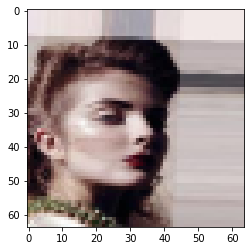

img_noise:


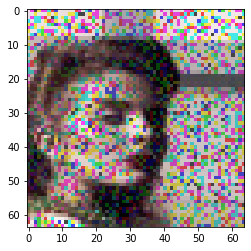

img_recon:


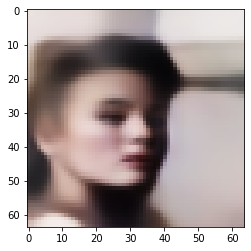

mes_loss: 0.10434594750404358
img:


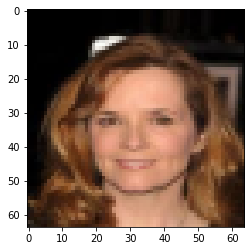

img_noise:


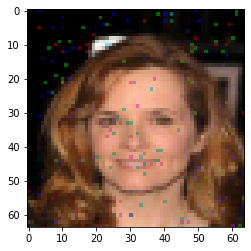

img_recon:


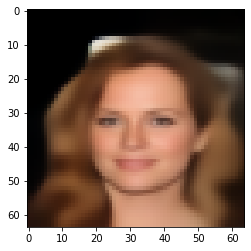

mes_loss: 0.07595998048782349


   Iters      Elapsed Time      Speed    epoch     loss         lr              
 1094/1094  00:02:14<00:00:00  8.11it/s  2/50   0.08465861  0.00010000          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

img:


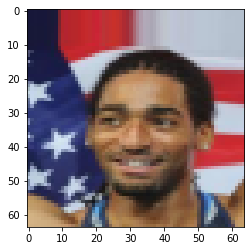

img_noise:


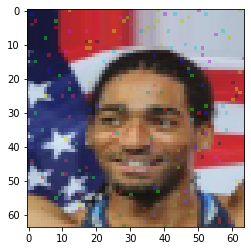

img_recon:


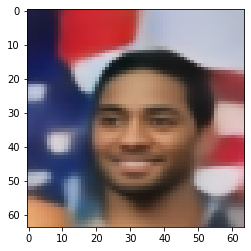

mes_loss: 0.11792256683111191
img:


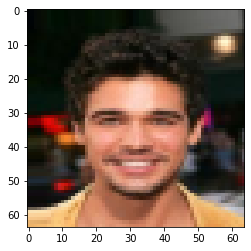

img_noise:


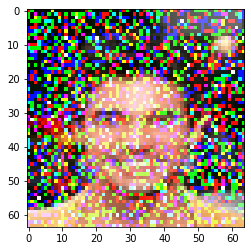

img_recon:


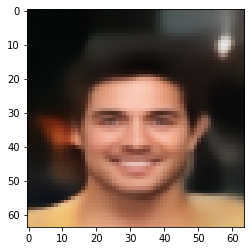

mes_loss: 0.09467853605747223
img:


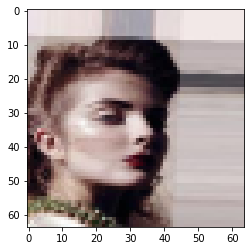

img_noise:


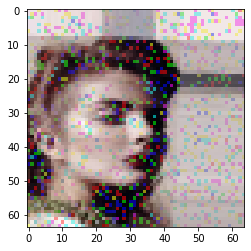

img_recon:


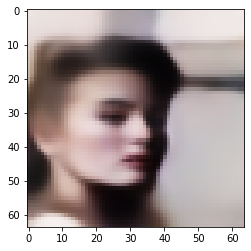

mes_loss: 0.09883423894643784
img:


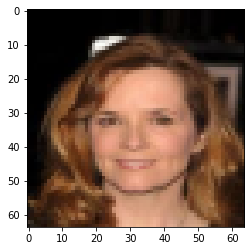

img_noise:


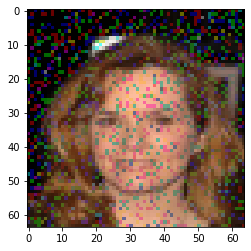

img_recon:


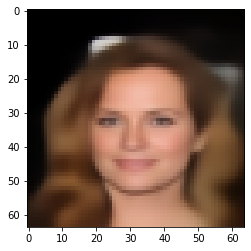

mes_loss: 0.07579807192087173


  Iters     Elapsed Time      Speed    epoch     loss         lr                
 40/1094  00:00:04<00:02:11  8.03it/s  3/50   0.08494199  0.00009964            

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

   Iters      Elapsed Time      Speed    epoch     loss         lr              
 1094/1094  00:02:14<00:00:00  8.11it/s  3/50   0.08239349  0.00000100          

img:


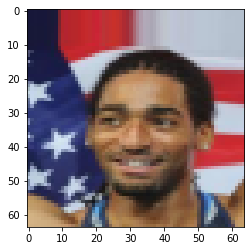

img_noise:


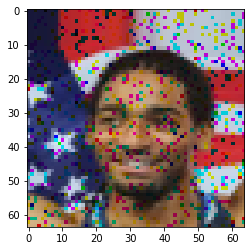

img_recon:


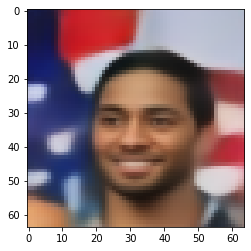

mes_loss: 0.11409731209278107
img:


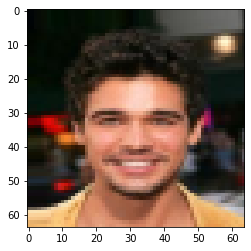

img_noise:


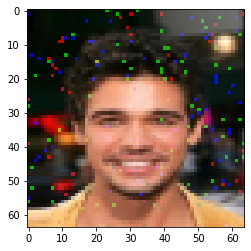

img_recon:


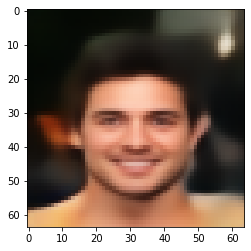

mes_loss: 0.08796423673629761
img:


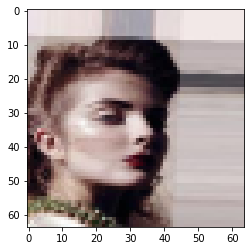

img_noise:


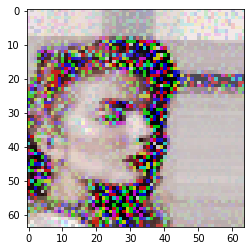

img_recon:


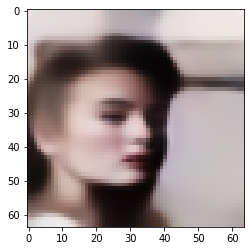

mes_loss: 0.10196217149496078
img:


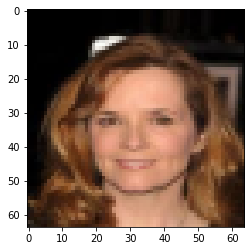

img_noise:


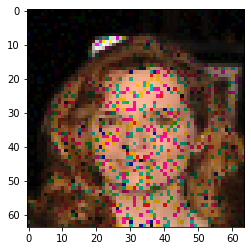

img_recon:


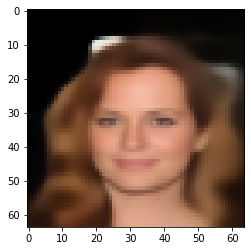

mes_loss: 0.07165571302175522


   Iters      Elapsed Time      Speed    epoch     loss         lr              
 1094/1094  00:02:16<00:00:00  8.02it/s  4/50   0.08185485  0.00010000          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

img:


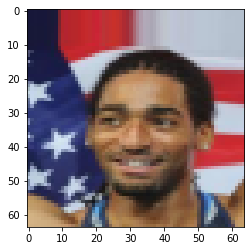

img_noise:


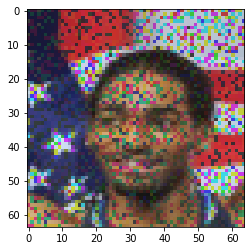

img_recon:


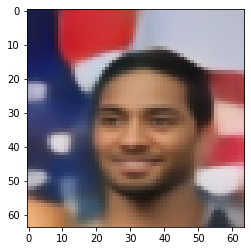

mes_loss: 0.11904288083314896
img:


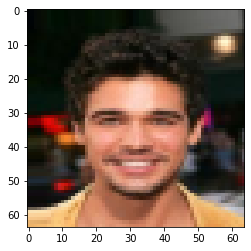

img_noise:


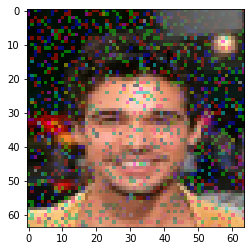

img_recon:


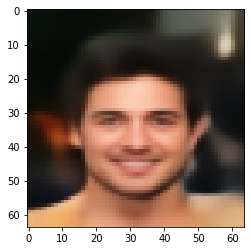

mes_loss: 0.0922083705663681
img:


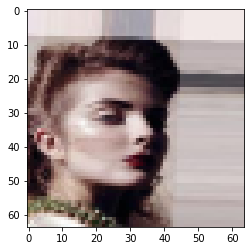

img_noise:


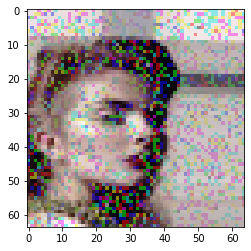

img_recon:


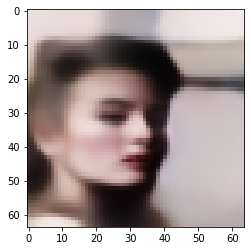

mes_loss: 0.09913703799247742
img:


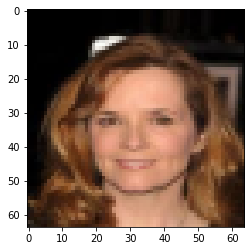

img_noise:


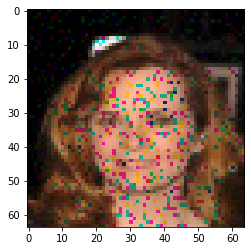

img_recon:


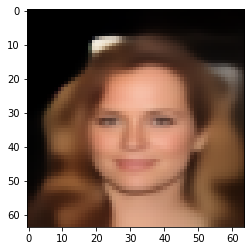

mes_loss: 0.07440382987260818


   Iters      Elapsed Time      Speed    epoch     loss         lr              
 1094/1094  00:02:16<00:00:00  8.02it/s  5/50   0.08067319  0.00000101          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

img:


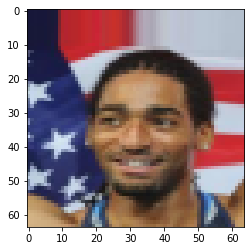

img_noise:


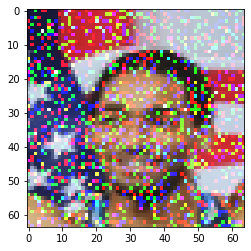

img_recon:


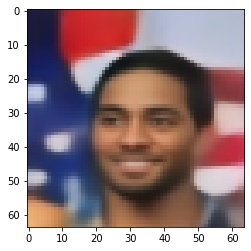

mes_loss: 0.11450280994176865
img:


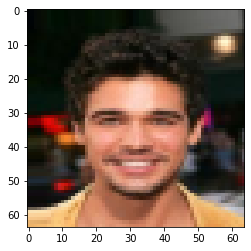

img_noise:


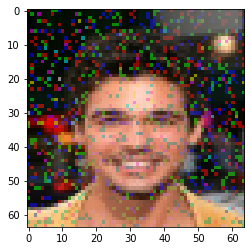

img_recon:


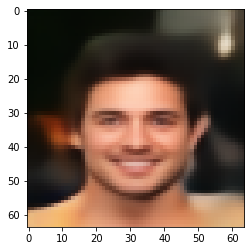

mes_loss: 0.08777008950710297
img:


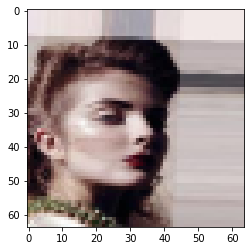

img_noise:


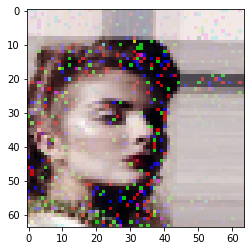

img_recon:


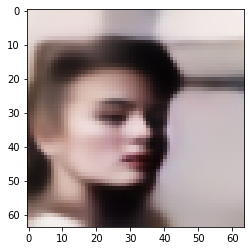

mes_loss: 0.09377744793891907
img:


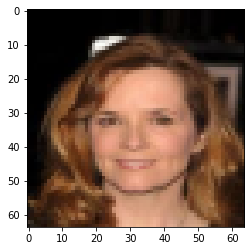

img_noise:


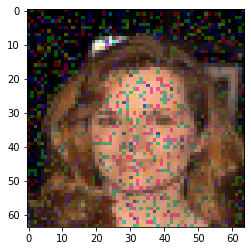

img_recon:


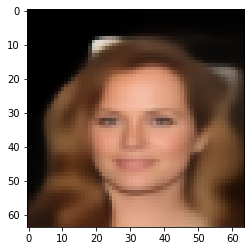

mes_loss: 0.07082532346248627


   Iters      Elapsed Time      Speed    epoch     loss         lr              
 1094/1094  00:02:17<00:00:00  7.96it/s  6/50   0.08040639  0.00009999          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

img:


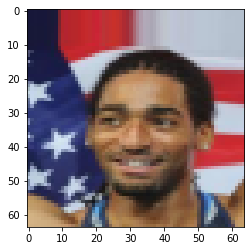

img_noise:


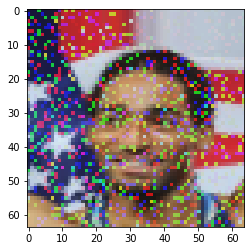

img_recon:


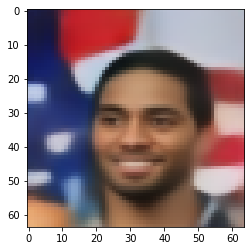

mes_loss: 0.11513400077819824
img:


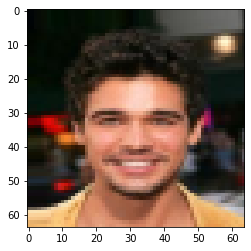

img_noise:


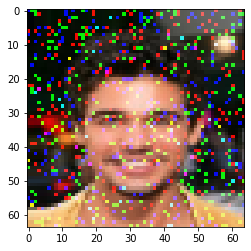

img_recon:


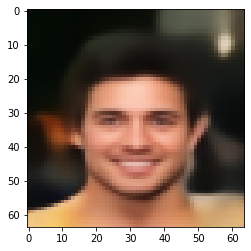

mes_loss: 0.08814854919910431
img:


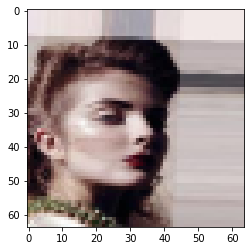

img_noise:


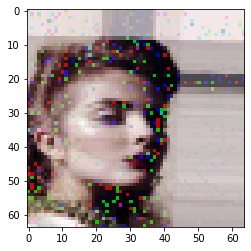

img_recon:


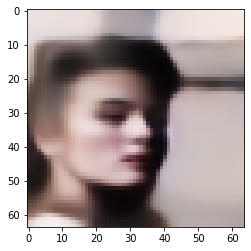

mes_loss: 0.09895150363445282
img:


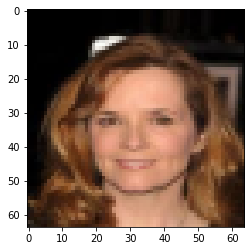

img_noise:


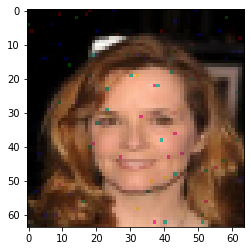

img_recon:


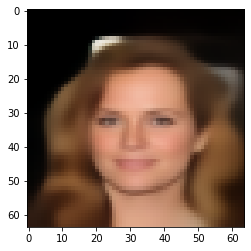

mes_loss: 0.07248154282569885


   Iters      Elapsed Time      Speed    epoch     loss         lr              
 1094/1094  00:02:17<00:00:00  7.96it/s  7/50   0.07967637  0.00000101          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

img:


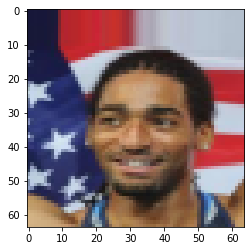

img_noise:


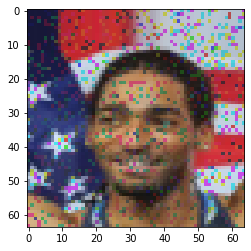

img_recon:


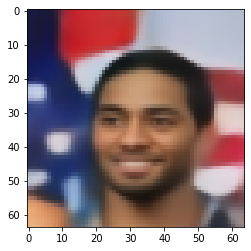

mes_loss: 0.10921948403120041
img:


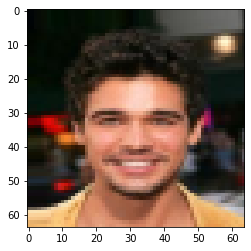

img_noise:


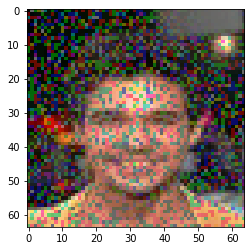

img_recon:


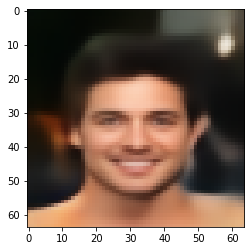

mes_loss: 0.09053985029459
img:


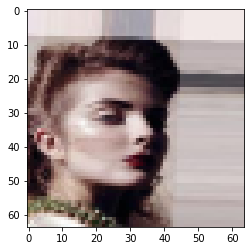

img_noise:


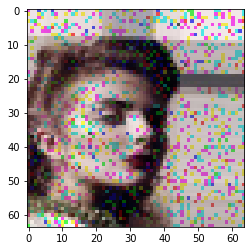

img_recon:


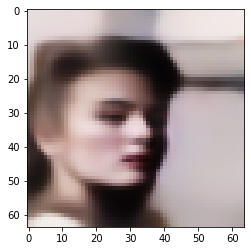

mes_loss: 0.09269200265407562
img:


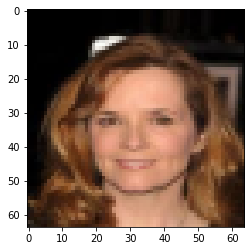

img_noise:


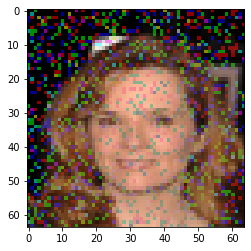

img_recon:


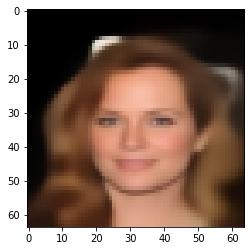

mes_loss: 0.06862855702638626


   Iters      Elapsed Time      Speed    epoch     loss         lr              
 1094/1094  00:02:17<00:00:00  7.96it/s  8/50   0.07943545  0.00009999          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

img:


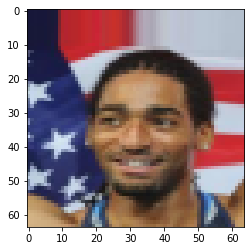

img_noise:


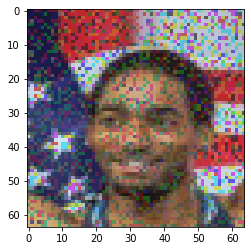

img_recon:


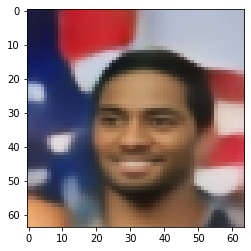

mes_loss: 0.11542301625013351
img:


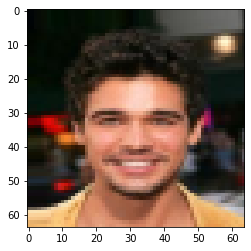

img_noise:


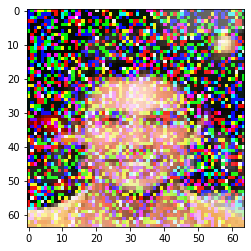

img_recon:


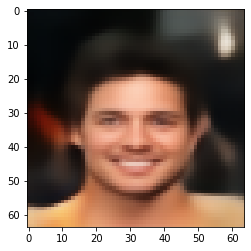

mes_loss: 0.09737470746040344
img:


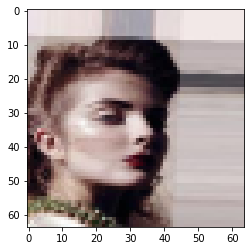

img_noise:


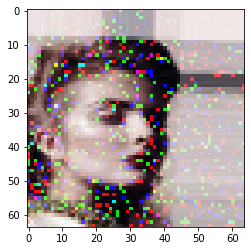

img_recon:


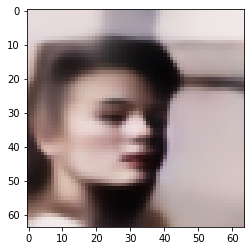

mes_loss: 0.09723590314388275
img:


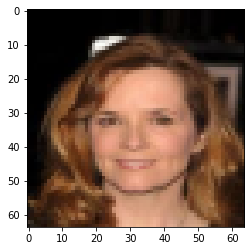

img_noise:


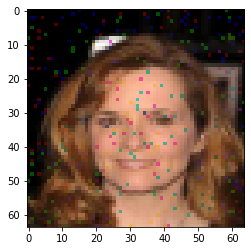

img_recon:


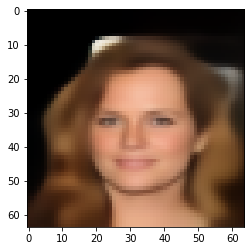

mes_loss: 0.07267162948846817


   Iters      Elapsed Time      Speed    epoch     loss         lr              
 1094/1094  00:02:23<00:00:00  7.64it/s  9/50   0.07890935  0.00000102          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

img:


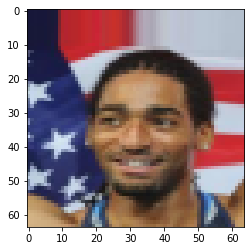

img_noise:


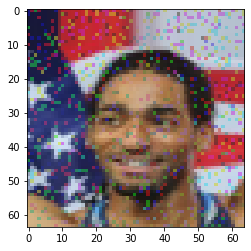

img_recon:


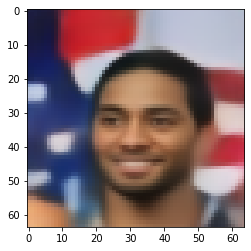

mes_loss: 0.10821932554244995
img:


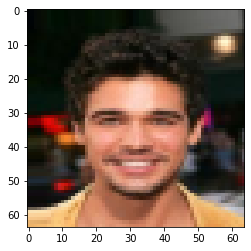

img_noise:


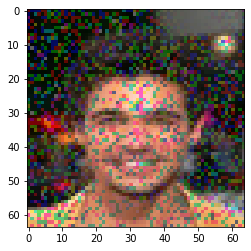

img_recon:


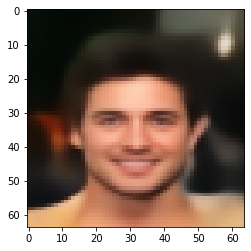

mes_loss: 0.08653370290994644
img:


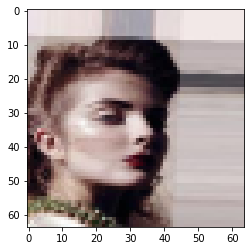

img_noise:


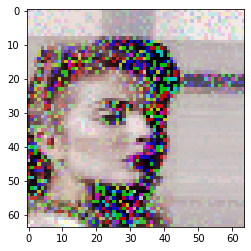

img_recon:


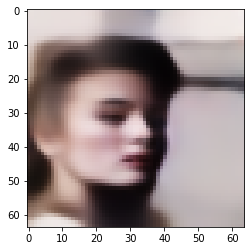

mes_loss: 0.09271173924207687
img:


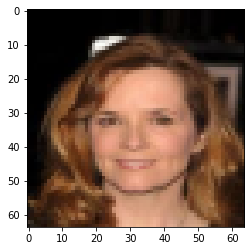

img_noise:


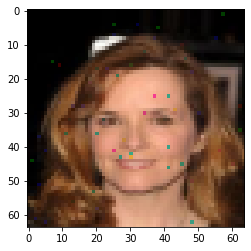

img_recon:


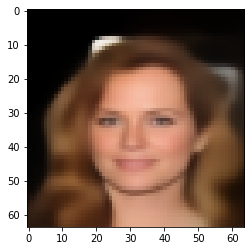

mes_loss: 0.06838247925043106


   Iters      Elapsed Time      Speed    epoch     loss         lr              
 1094/1094  00:02:20<00:00:00  7.79it/s  10/50  0.07876278  0.00009998          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

img:


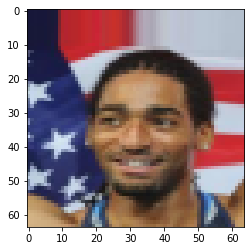

img_noise:


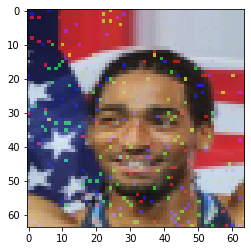

img_recon:


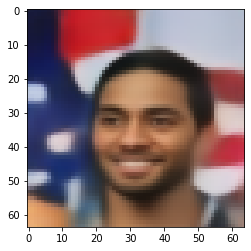

mes_loss: 0.11293334513902664
img:


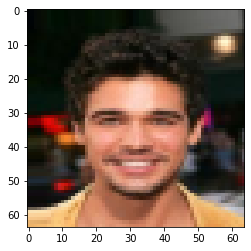

img_noise:


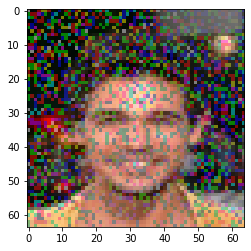

img_recon:


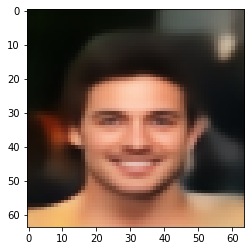

mes_loss: 0.0889715701341629
img:


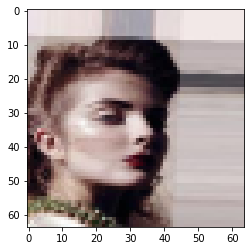

img_noise:


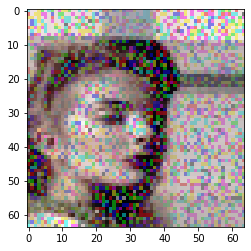

img_recon:


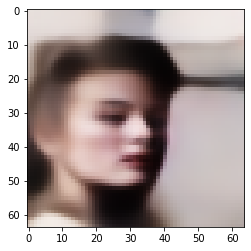

mes_loss: 0.0969405248761177
img:


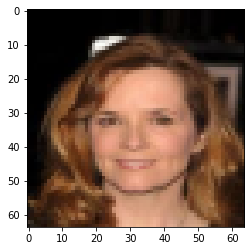

img_noise:


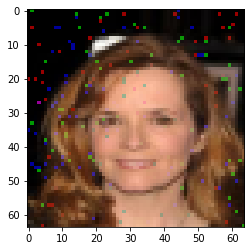

img_recon:


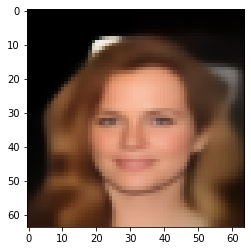

mes_loss: 0.06950785964727402


   Iters      Elapsed Time      Speed    epoch     loss         lr              
 1094/1094  00:02:20<00:00:00  7.80it/s  11/50  0.07831906  0.00000102          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

img:


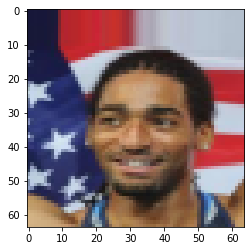

img_noise:


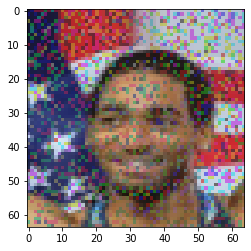

img_recon:


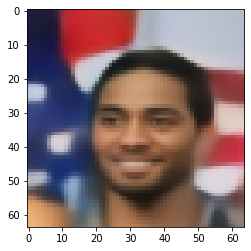

mes_loss: 0.1095162183046341
img:


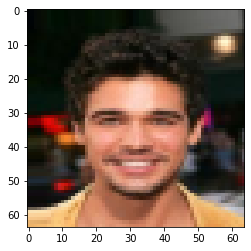

img_noise:


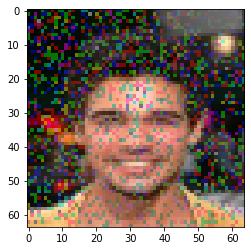

img_recon:


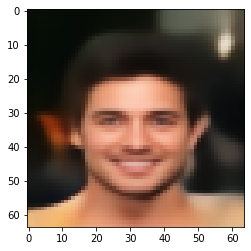

mes_loss: 0.08618112653493881
img:


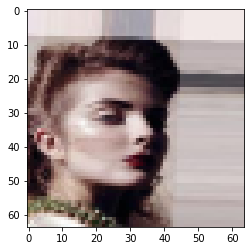

img_noise:


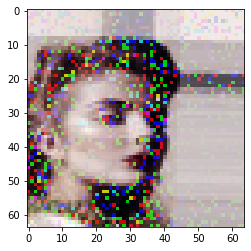

img_recon:


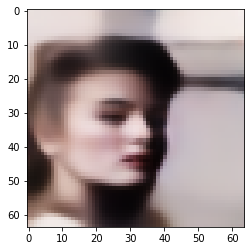

mes_loss: 0.09117582440376282
img:


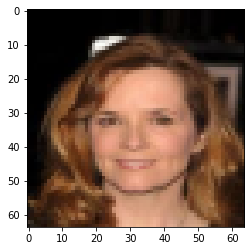

img_noise:


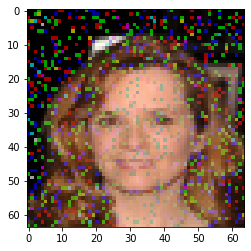

img_recon:


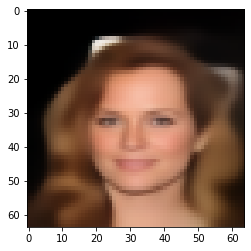

mes_loss: 0.0679161474108696


   Iters      Elapsed Time      Speed    epoch     loss         lr              
 1094/1094  00:02:19<00:00:00  7.82it/s  12/50  0.07828095  0.00009997          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

img:


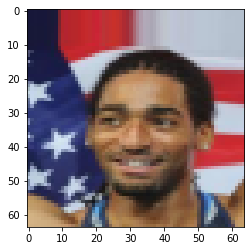

img_noise:


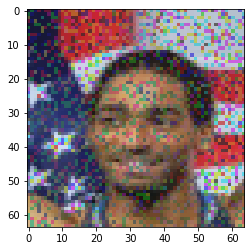

img_recon:


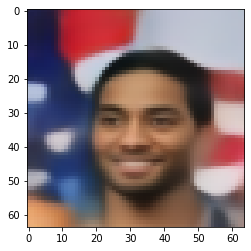

mes_loss: 0.11761768162250519
img:


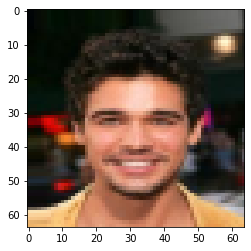

img_noise:


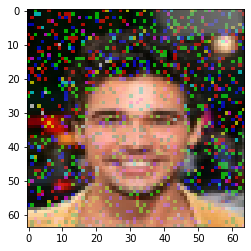

img_recon:


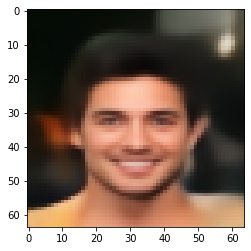

mes_loss: 0.08870157599449158
img:


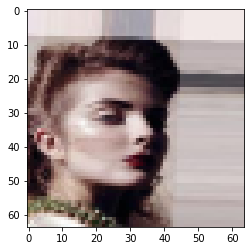

img_noise:


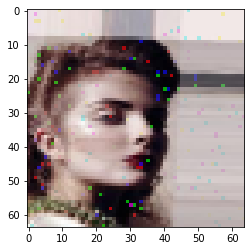

img_recon:


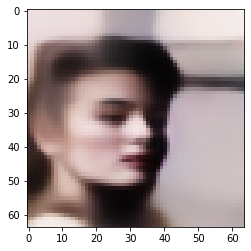

mes_loss: 0.09340665489435196
img:


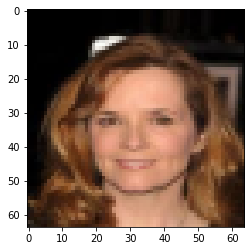

img_noise:


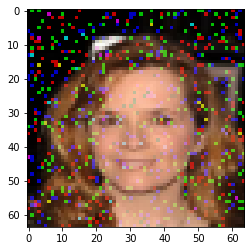

img_recon:


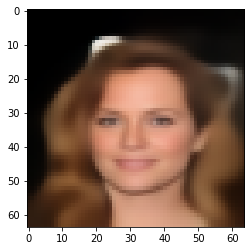

mes_loss: 0.07150119543075562


   Iters      Elapsed Time      Speed    epoch     loss         lr              
 1094/1094  00:02:20<00:00:00  7.80it/s  13/50  0.07778122  0.00000103          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

img:


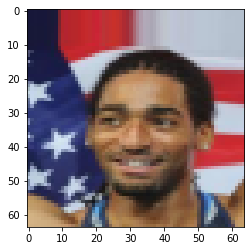

img_noise:


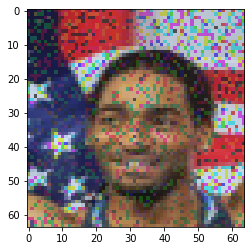

img_recon:


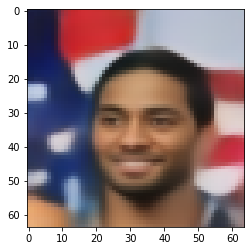

mes_loss: 0.10884705930948257
img:


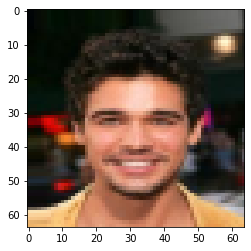

img_noise:


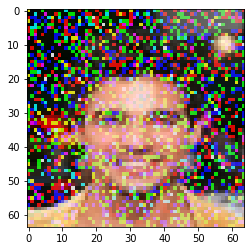

img_recon:


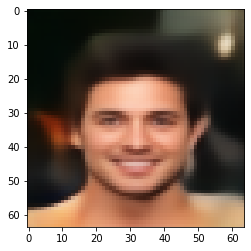

mes_loss: 0.08552412688732147
img:


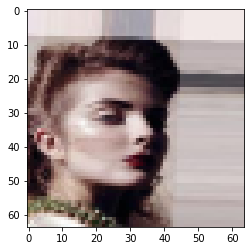

img_noise:


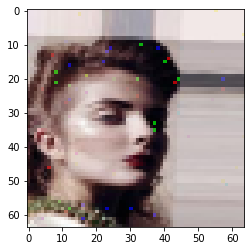

img_recon:


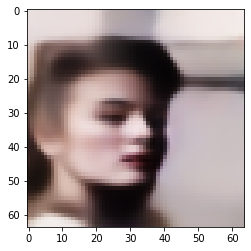

mes_loss: 0.0909443348646164
img:


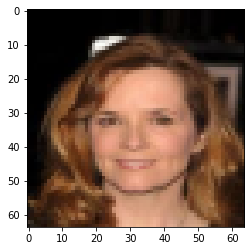

img_noise:


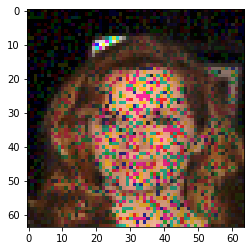

img_recon:


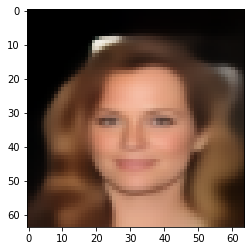

mes_loss: 0.06925738602876663


   Iters      Elapsed Time      Speed    epoch     loss         lr              
 1094/1094  00:02:20<00:00:00  7.80it/s  14/50  0.07775889  0.00009996          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

img:


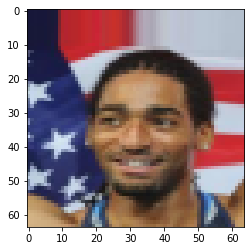

img_noise:


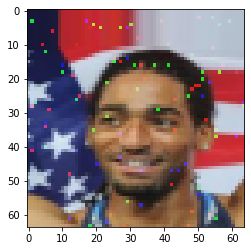

img_recon:


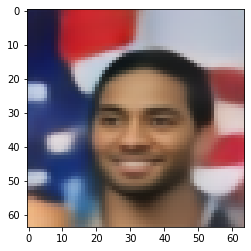

mes_loss: 0.11307190358638763
img:


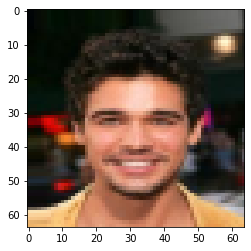

img_noise:


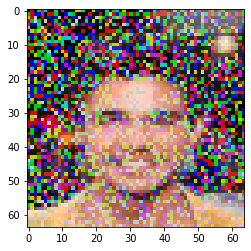

img_recon:


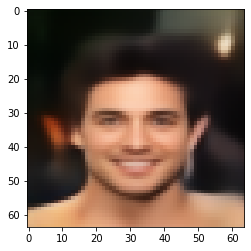

mes_loss: 0.09327471256256104
img:


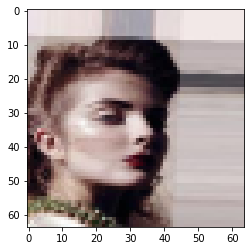

img_noise:


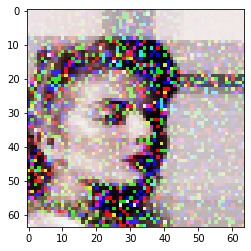

img_recon:


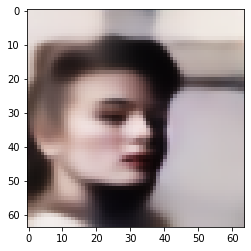

mes_loss: 0.09493459761142731
img:


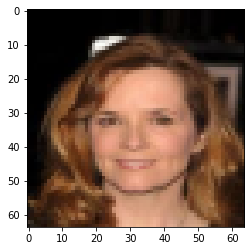

img_noise:


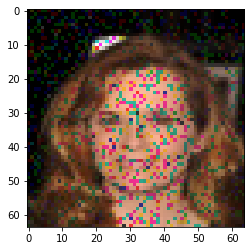

img_recon:


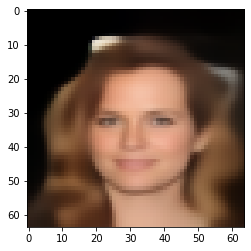

mes_loss: 0.0736858919262886


   Iters      Elapsed Time      Speed    epoch     loss         lr              
 1094/1094  00:02:20<00:00:00  7.81it/s  15/50  0.07740408  0.00000105          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

img:


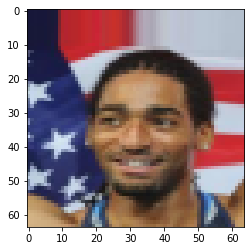

img_noise:


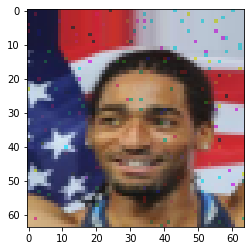

img_recon:


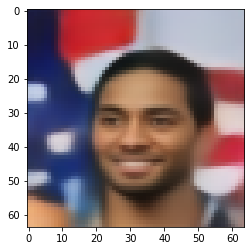

mes_loss: 0.10636396706104279
img:


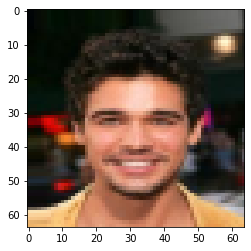

img_noise:


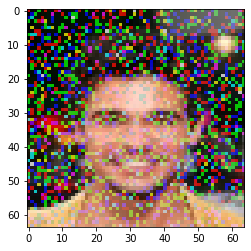

img_recon:


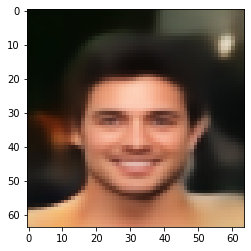

mes_loss: 0.08493504673242569
img:


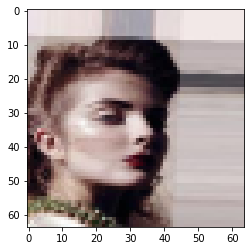

img_noise:


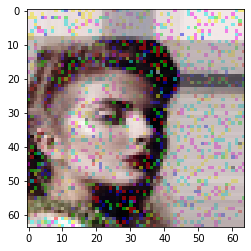

img_recon:


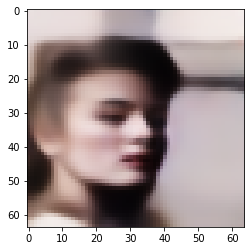

mes_loss: 0.08954187482595444
img:


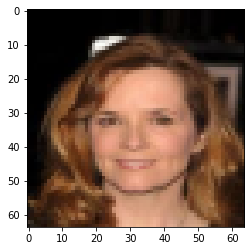

img_noise:


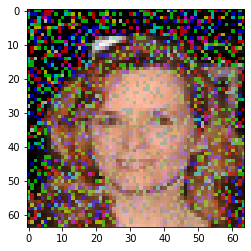

img_recon:


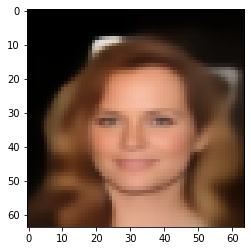

mes_loss: 0.06745388358831406


   Iters      Elapsed Time      Speed    epoch     loss         lr              
 1094/1094  00:02:19<00:00:00  7.83it/s  16/50  0.07739023  0.00009995          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

img:


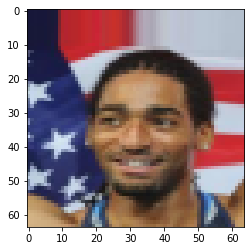

img_noise:


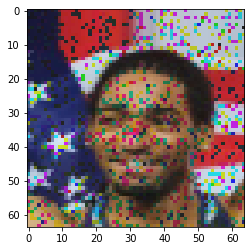

img_recon:


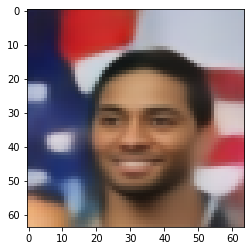

mes_loss: 0.11169556528329849
img:


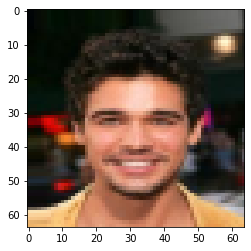

img_noise:


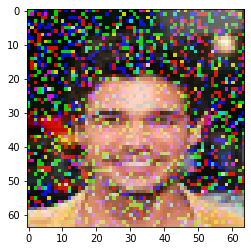

img_recon:


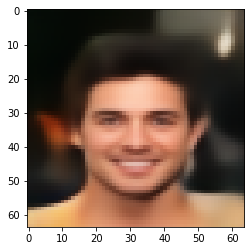

mes_loss: 0.087273508310318
img:


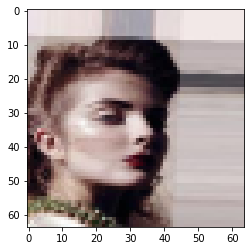

img_noise:


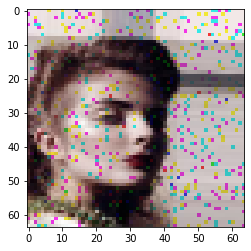

img_recon:


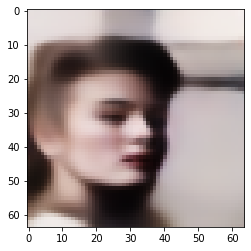

mes_loss: 0.09092891961336136
img:


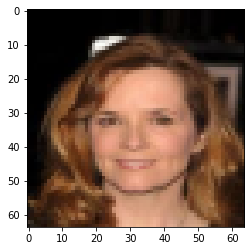

img_noise:


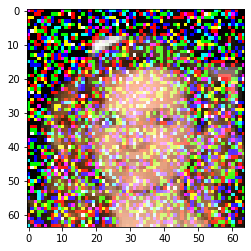

img_recon:


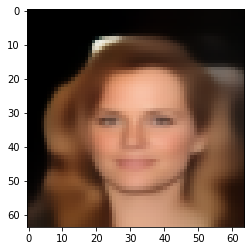

mes_loss: 0.07534758001565933


   Iters      Elapsed Time      Speed    epoch     loss         lr              
 1094/1094  00:02:20<00:00:00  7.79it/s  17/50  0.07707303  0.00000106          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

img:


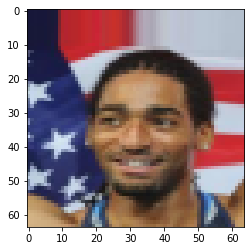

img_noise:


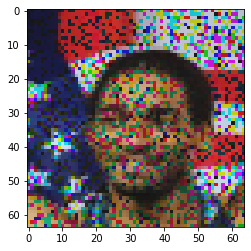

img_recon:


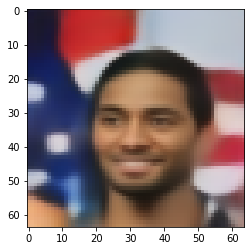

mes_loss: 0.11027583479881287
img:


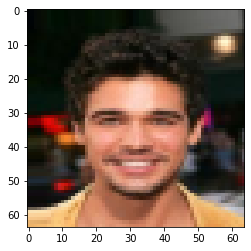

img_noise:


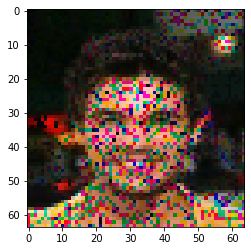

img_recon:


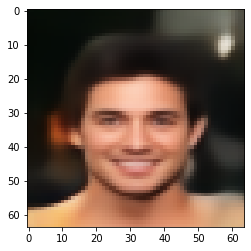

mes_loss: 0.08655239641666412
img:


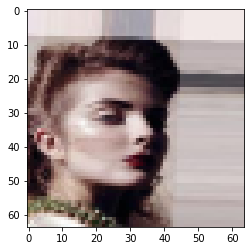

img_noise:


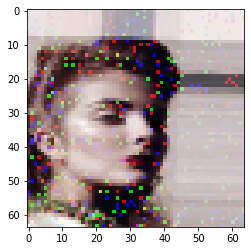

img_recon:


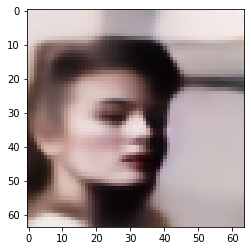

mes_loss: 0.09003022313117981
img:


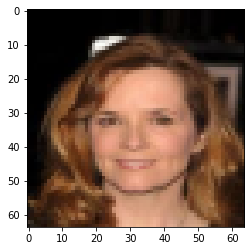

img_noise:


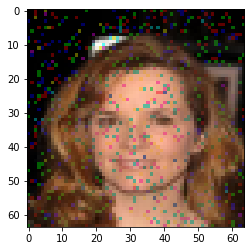

img_recon:


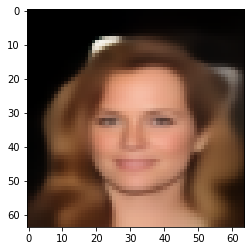

mes_loss: 0.06701335310935974


   Iters      Elapsed Time      Speed    epoch     loss         lr              
 1094/1094  00:02:21<00:00:00  7.74it/s  18/50  0.07709121  0.00009993          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

img:


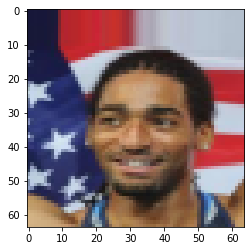

img_noise:


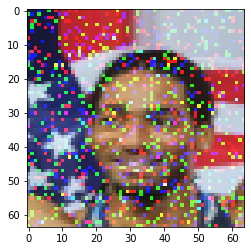

img_recon:


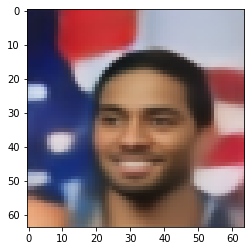

mes_loss: 0.1119304895401001
img:


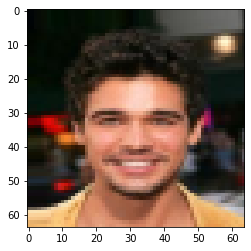

img_noise:


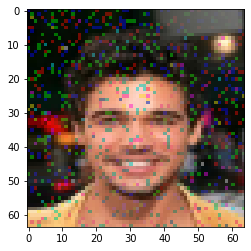

img_recon:


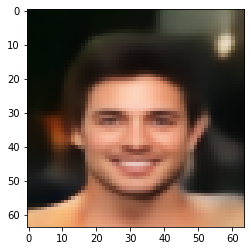

mes_loss: 0.08499650657176971
img:


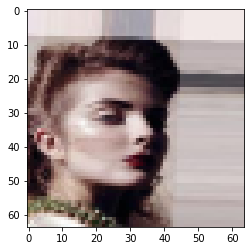

img_noise:


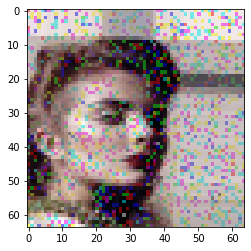

img_recon:


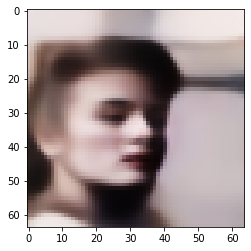

mes_loss: 0.09330900013446808
img:


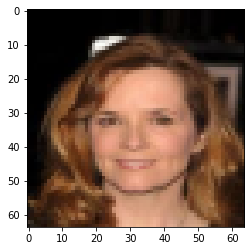

img_noise:


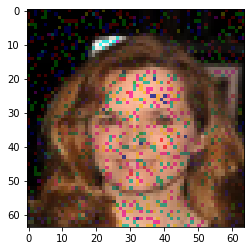

img_recon:


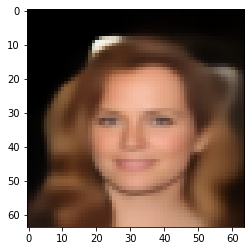

mes_loss: 0.06904418021440506


   Iters      Elapsed Time      Speed    epoch     loss         lr              
 1094/1094  00:02:18<00:00:00  7.89it/s  19/50  0.07675105  0.00000107          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

img:


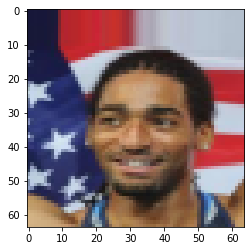

img_noise:


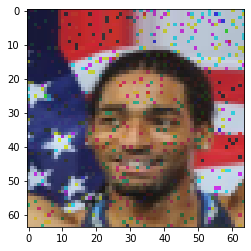

img_recon:


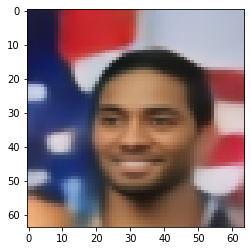

mes_loss: 0.10616949945688248
img:


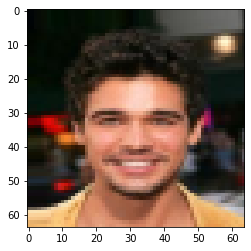

img_noise:


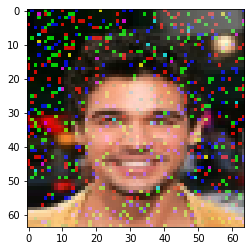

img_recon:


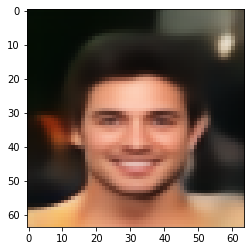

mes_loss: 0.08215492963790894
img:


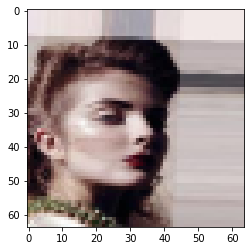

img_noise:


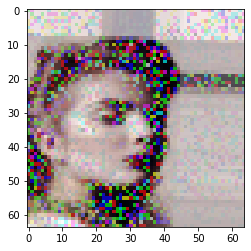

img_recon:


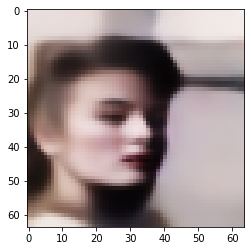

mes_loss: 0.09214504808187485
img:


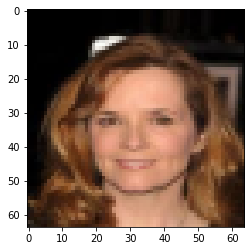

img_noise:


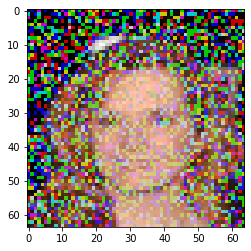

img_recon:


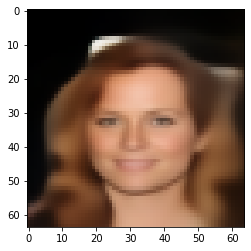

mes_loss: 0.07460714876651764


   Iters      Elapsed Time      Speed    epoch     loss         lr              
 1094/1094  00:02:20<00:00:00  7.79it/s  20/50  0.07677968  0.00009992          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

img:


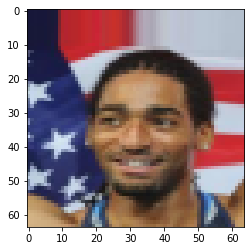

img_noise:


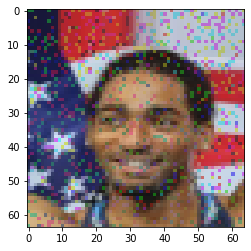

img_recon:


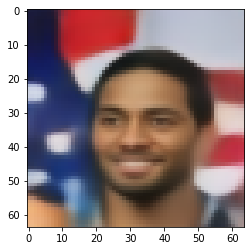

mes_loss: 0.10985832661390305
img:


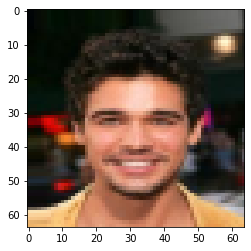

img_noise:


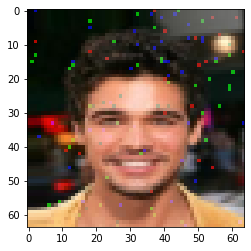

img_recon:


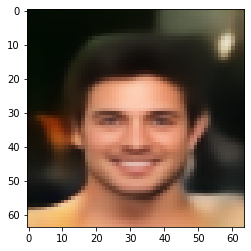

mes_loss: 0.08522958308458328
img:


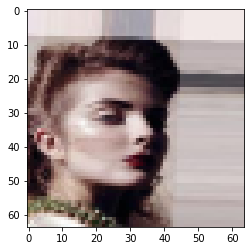

img_noise:


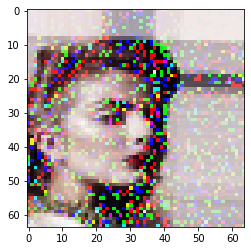

img_recon:


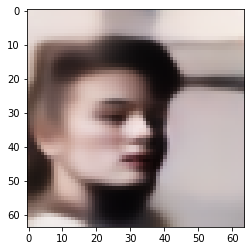

mes_loss: 0.0940416157245636
img:


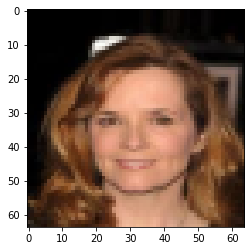

img_noise:


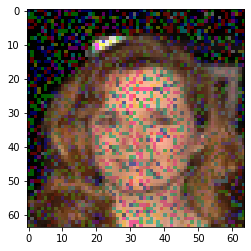

img_recon:


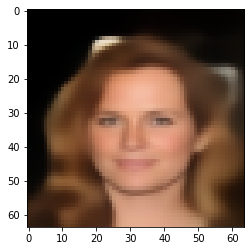

mes_loss: 0.0696774572134018


   Iters      Elapsed Time      Speed    epoch     loss         lr              
 1094/1094  00:02:21<00:00:00  7.74it/s  21/50  0.07650024  0.00000109          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

img:


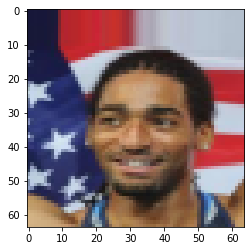

img_noise:


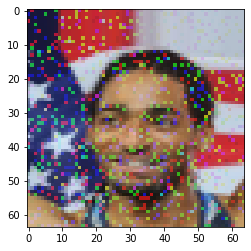

img_recon:


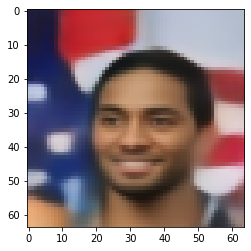

mes_loss: 0.10506691783666611
img:


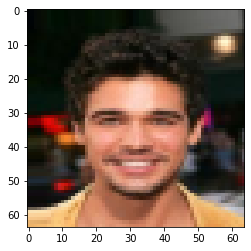

img_noise:


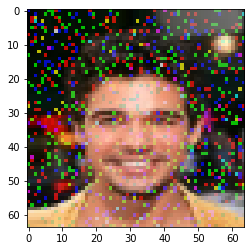

img_recon:


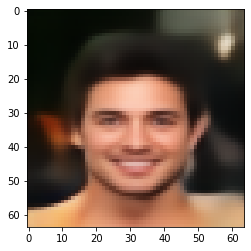

mes_loss: 0.08393210917711258
img:


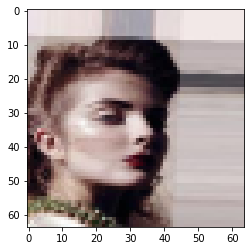

img_noise:


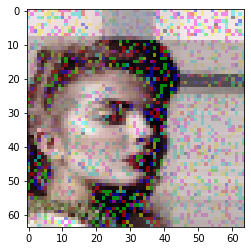

img_recon:


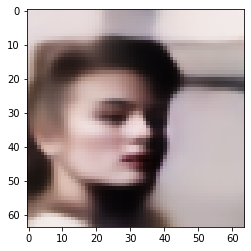

mes_loss: 0.08887065947055817
img:


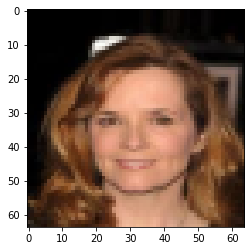

img_noise:


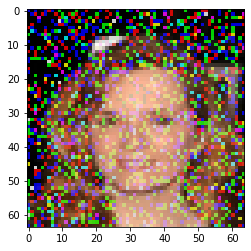

img_recon:


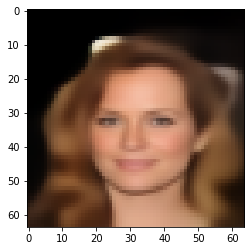

mes_loss: 0.06894301623106003


  Iters     Elapsed Time      Speed    epoch     loss         lr                
 70/1094  00:00:09<00:02:13  7.68it/s  22/50  0.07563901  0.00000268            

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

img:


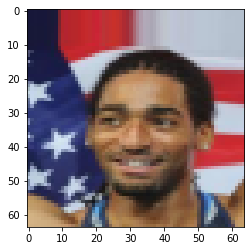

img_noise:


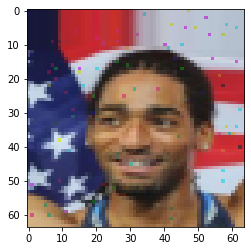

img_recon:


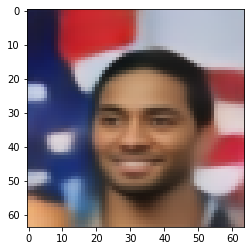

mes_loss: 0.10515876859426498
img:


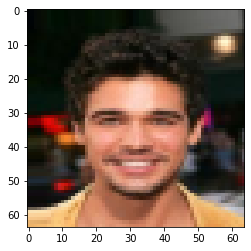

img_noise:


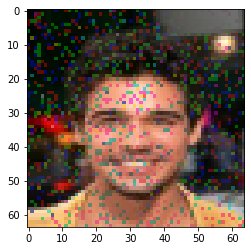

img_recon:


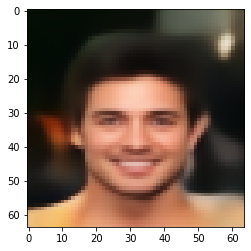

mes_loss: 0.0833800733089447
img:


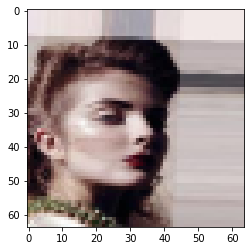

img_noise:


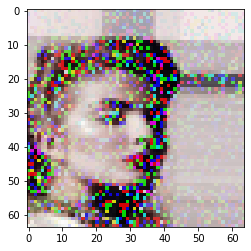

img_recon:


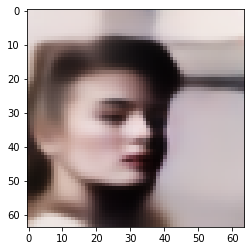

mes_loss: 0.09009332954883575
img:


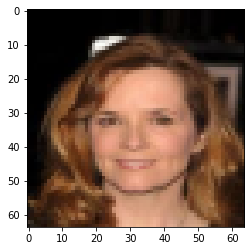

img_noise:


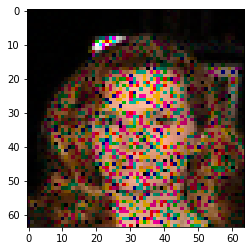

img_recon:


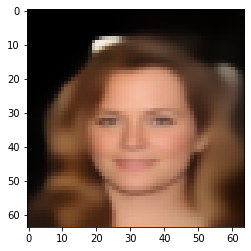

mes_loss: 0.06924086809158325


 Iters     Elapsed Time      Speed    epoch     loss         lr                 
 4/1094  00:00:00<00:02:40  6.80it/s  23/50  0.07511159  0.00000283             

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

KeyboardInterrupt: ignored

In [76]:
best_loss = np.inf

# qqdm_train = qqdm(range(num_epochs), desc=format_str('bold', 'Description'))
for epoch in range(num_epochs):
    tot_loss = list()
    loop = qqdm(train_dataloader)
    model.train()
    for batch_idx, (img, img_noise) in enumerate(loop):
        # ===================loading=====================
        img, img_noise = img.float().cuda(), img_noise.float().cuda()

        # ===================forward=====================
        loss = model.loss(img, img_noise)
        tot_loss.append(loss.item())

        # ===================backward====================
        optimizer.zero_grad()
        accelerator.backward(loss)
        optimizer.step()
        scheduler.step()

        # =====================log=======================
        mean_loss = np.mean(tot_loss)
        loop.set_infos({
          'epoch': f'{epoch + 1:.0f}/{num_epochs:.0f}',
          'loss': f'{mean_loss:.8f}',
          'lr': f'{optimizer.param_groups[0]["lr"]:.8f}'
        })

    # ===================show_img=====================
    model.eval()
    with torch.no_grad():
        for i in range(4):
            img, img_noise = train_dataset[i]

            img = img.reshape(1, img.shape[0], img.shape[1], img.shape[2])
            img = img.float().cuda()

            img_noise = img_noise.reshape(1, img_noise.shape[0], img_noise.shape[1], img_noise.shape[2])
            img_noise = img_noise.float().cuda()

            loss = model.loss(img, img_noise).item()

            img_recon = model(img_noise)
            # img_recon_recon = model(img_recon)

            img = img.reshape(img.shape[1], img.shape[2], img.shape[3])
            img = img.cpu()

            img_noise = img_noise.reshape(img_noise.shape[1], img_noise.shape[2], img_noise.shape[3])
            img_noise = img_noise.cpu()

            img_recon = img_recon.reshape(img_recon.shape[1], img_recon.shape[2], img_recon.shape[3])
            img_recon = img_recon.cpu()

            # img_recon_recon = img_recon_recon.reshape(img_recon_recon.shape[1], img_recon_recon.shape[2], img_recon_recon.shape[3])
            # img_recon_recon = img_recon_recon.cpu()

            # show original photo
            print('img:')
            show_img(img*0.5+0.5)

            # show noised photo
            print('img_noise:')
            show_img(img_noise*0.5+0.5)

            # show reconstructive photo
            print('img_recon:')
            show_img(img_recon*0.5+0.5)

            # # show rereconstructive photo
            # print('img_recon_recon:')
            # show_img(img_recon_recon*0.5+0.5)

            print(f'mes_loss: {loss}')

    # ===================save_best====================
    mean_loss = np.mean(tot_loss)
    if mean_loss < best_loss:
        best_loss = mean_loss
        # torch.save(model, f'{workspace}/models/best_model_{model_type}.pt')
        torch.save(model, f'{workspace}/models/best_model_{model_type}_003.pt')
    # ===================save_last========================
    # torch.save(model, f'{workspace}/models/last_model_{model_type}.pt')
    torch.save(model, f'{workspace}/models/last_model_{model_type}_003.pt')




# Inference
Model is loaded and generates its anomaly score predictions.

## Initialize
- dataloader
- model
- prediction file

In [77]:
eval_batch_size = 1

# build testing dataloader
test_dataset = CustomTensorDataset(test, prob=0.0)
test_sampler = SequentialSampler(test_dataset)
test_dataloader = DataLoader(test_dataset, sampler=test_sampler, batch_size=eval_batch_size, num_workers=1)

# load trained model
checkpoint_path = f'{workspace}/models/best_model_{model_type}_003.pt'
model = torch.load(checkpoint_path)
model.eval()

# prediction file 
out_file = 'PREDICTION_FILE.csv'

img:


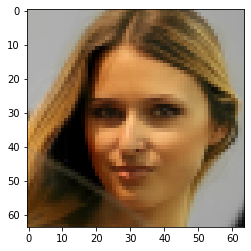

img_recon:


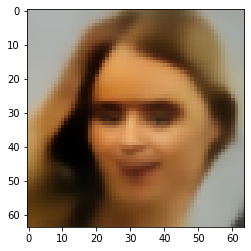

mes_loss: 0.07833202183246613
img:


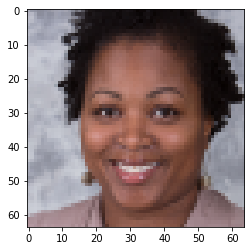

img_recon:


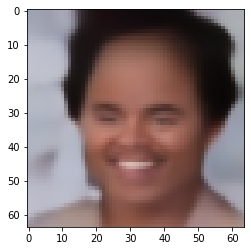

mes_loss: 0.07830646634101868
img:


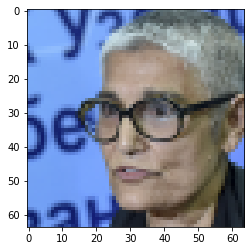

img_recon:


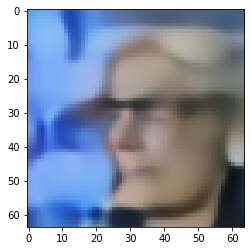

mes_loss: 0.15293699502944946
img:


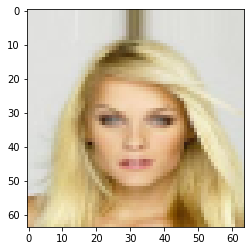

img_recon:


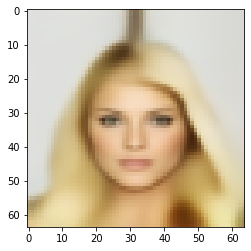

mes_loss: 0.052085451781749725
img:


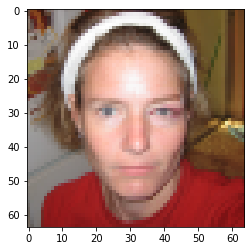

img_recon:


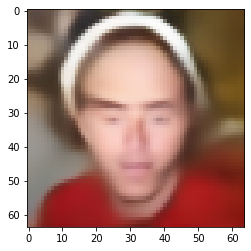

mes_loss: 0.10549832880496979
img:


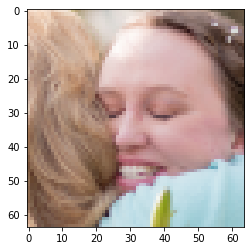

img_recon:


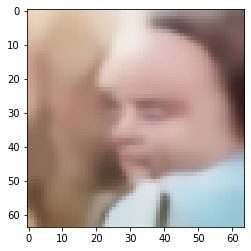

mes_loss: 0.09297861903905869
img:


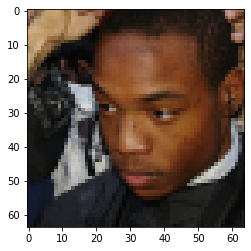

img_recon:


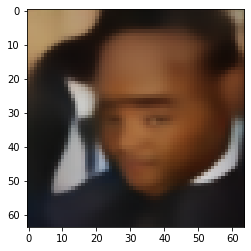

mes_loss: 0.09047183394432068
img:


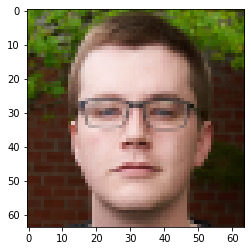

img_recon:


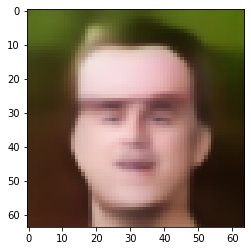

mes_loss: 0.09844912588596344
img:


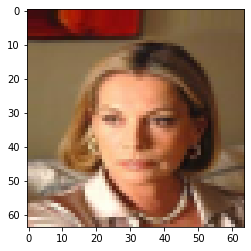

img_recon:


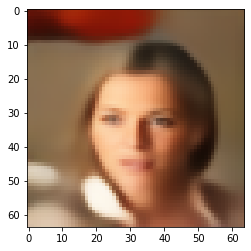

mes_loss: 0.09296523779630661
img:


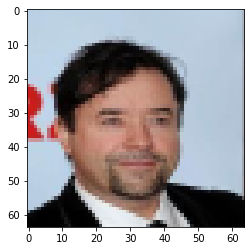

img_recon:


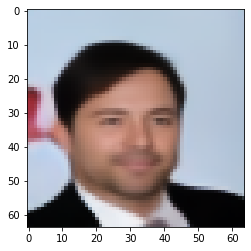

mes_loss: 0.059731852263212204
img:


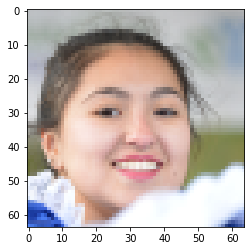

img_recon:


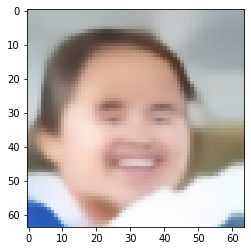

mes_loss: 0.08687908947467804
img:


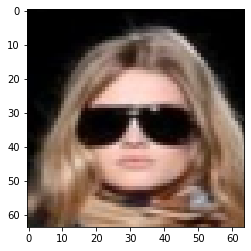

img_recon:


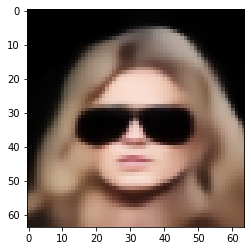

mes_loss: 0.08701740950345993
img:


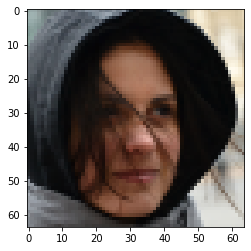

img_recon:


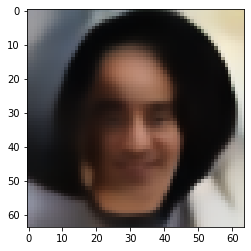

mes_loss: 0.07366222143173218
img:


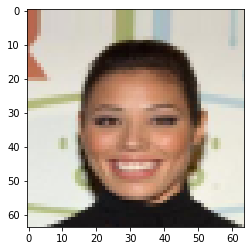

img_recon:


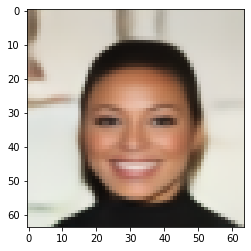

mes_loss: 0.05623304471373558
img:


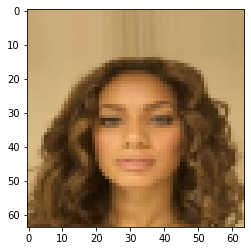

img_recon:


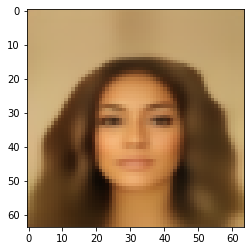

mes_loss: 0.051282141357660294
img:


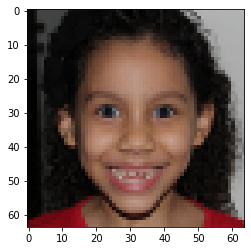

img_recon:


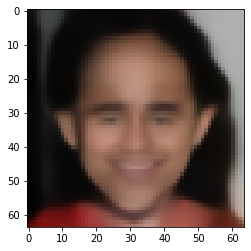

mes_loss: 0.07405035942792892
img:


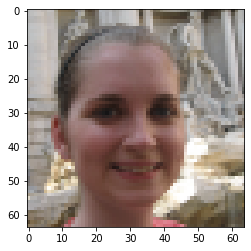

img_recon:


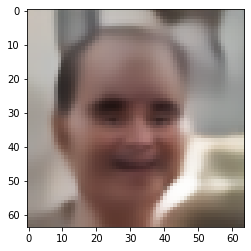

mes_loss: 0.11205340921878815
img:


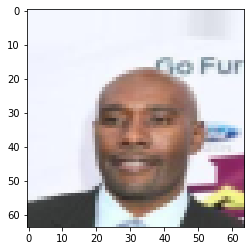

img_recon:


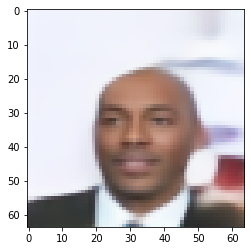

mes_loss: 0.0702265277504921
img:


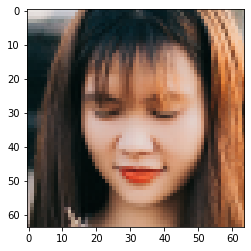

img_recon:


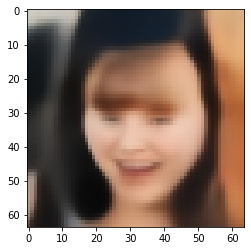

mes_loss: 0.11597110331058502
img:


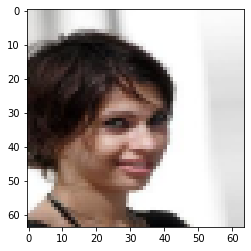

img_recon:


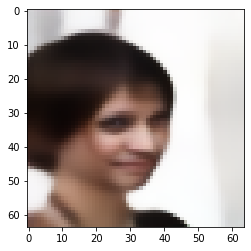

mes_loss: 0.06948339939117432
img:


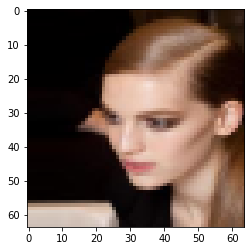

img_recon:


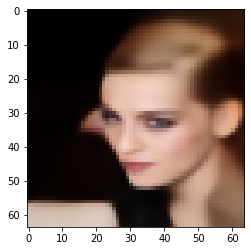

mes_loss: 0.057747647166252136
img:


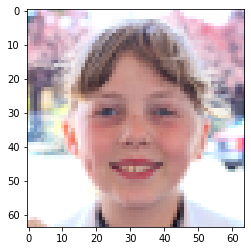

img_recon:


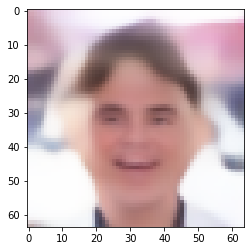

mes_loss: 0.1074090376496315
img:


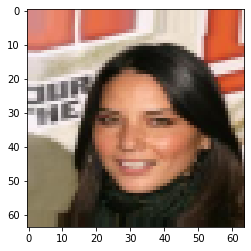

img_recon:


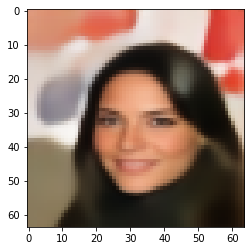

mes_loss: 0.1048305332660675
img:


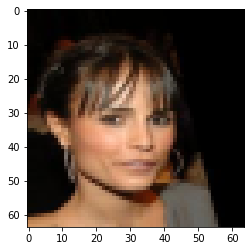

img_recon:


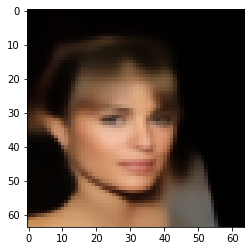

mes_loss: 0.05608304589986801
img:


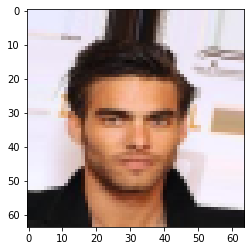

img_recon:


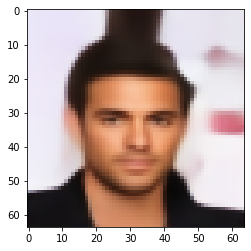

mes_loss: 0.06824970245361328
img:


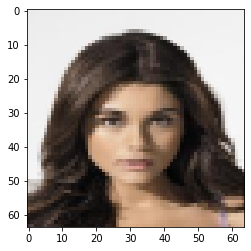

img_recon:


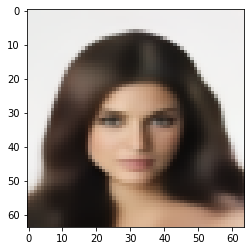

mes_loss: 0.060630783438682556
img:


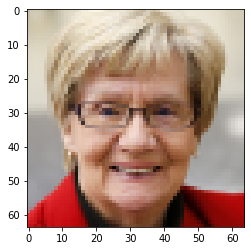

img_recon:


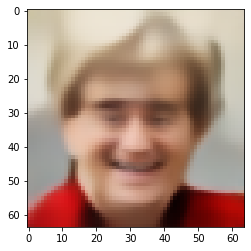

mes_loss: 0.10214553773403168
img:


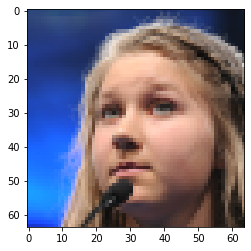

img_recon:


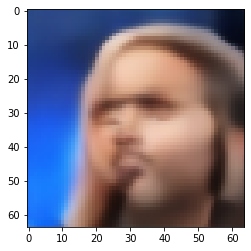

mes_loss: 0.12083512544631958
img:


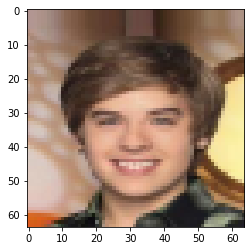

img_recon:


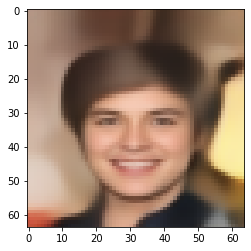

mes_loss: 0.07671207934617996
img:


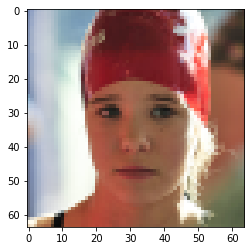

img_recon:


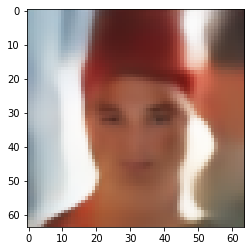

mes_loss: 0.09664171189069748
img:


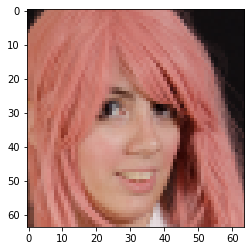

img_recon:


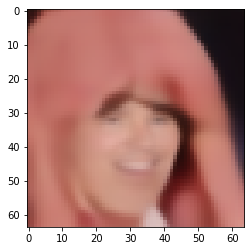

mes_loss: 0.082510806620121
img:


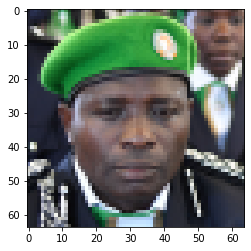

img_recon:


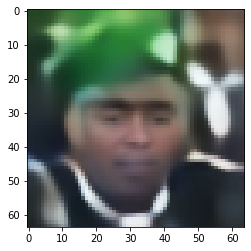

mes_loss: 0.18890422582626343
img:


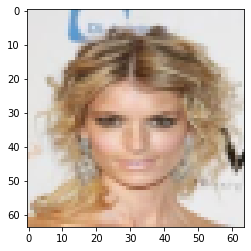

img_recon:


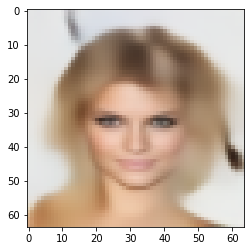

mes_loss: 0.08209236711263657
img:


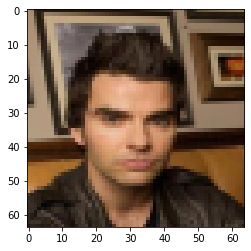

img_recon:


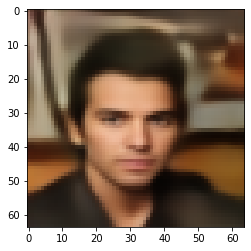

mes_loss: 0.12273414433002472
img:


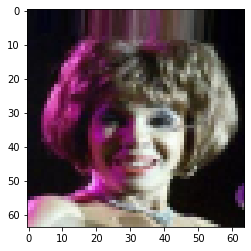

img_recon:


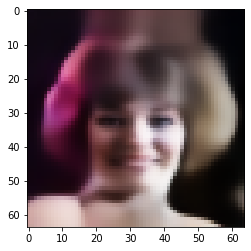

mes_loss: 0.1315811425447464
img:


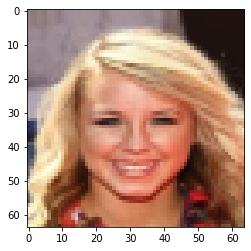

img_recon:


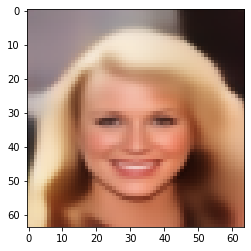

mes_loss: 0.08883287757635117
img:


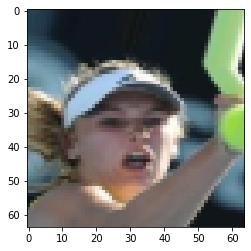

img_recon:


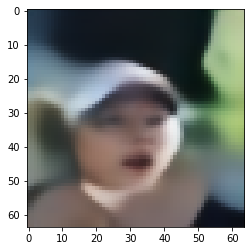

mes_loss: 0.10529932379722595
img:


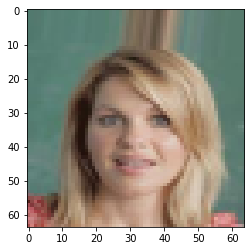

img_recon:


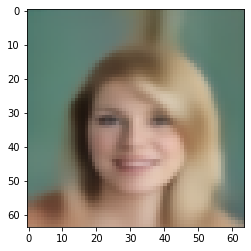

mes_loss: 0.060400985181331635
img:


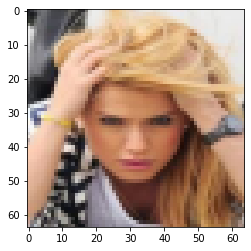

img_recon:


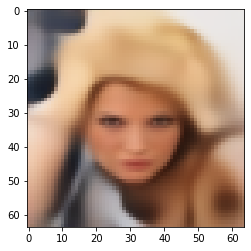

mes_loss: 0.11864113807678223
img:


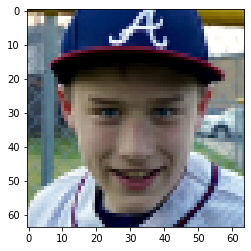

img_recon:


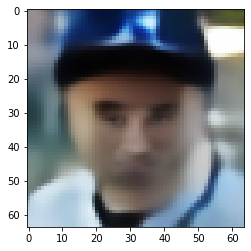

mes_loss: 0.16304974257946014
img:


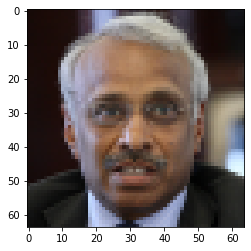

img_recon:


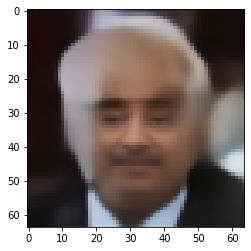

mes_loss: 0.08896089345216751
img:


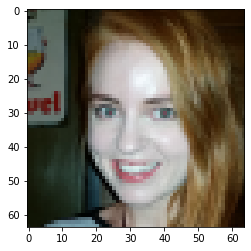

img_recon:


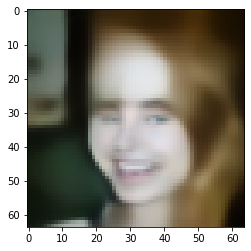

mes_loss: 0.09113018214702606
img:


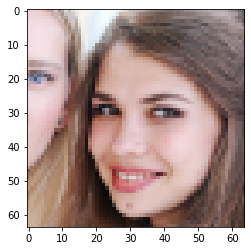

img_recon:


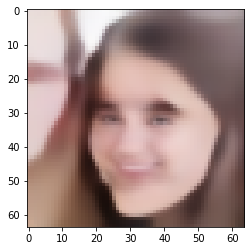

mes_loss: 0.09718973189592361
img:


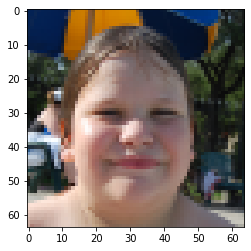

img_recon:


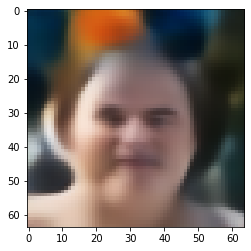

mes_loss: 0.1288735270500183
img:


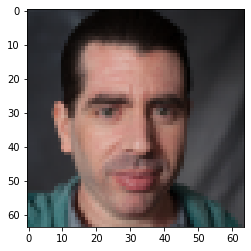

img_recon:


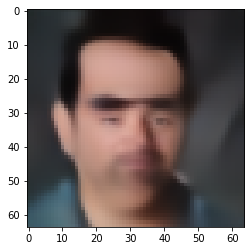

mes_loss: 0.07269007712602615
img:


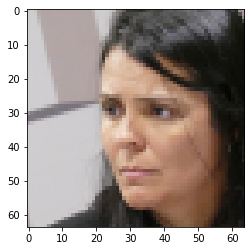

img_recon:


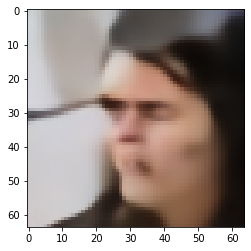

mes_loss: 0.08721813559532166
img:


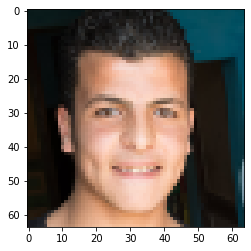

img_recon:


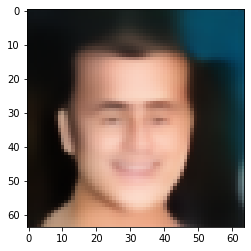

mes_loss: 0.0744686871767044
img:


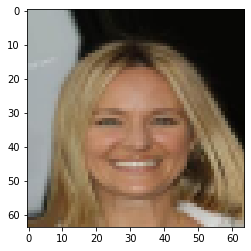

img_recon:


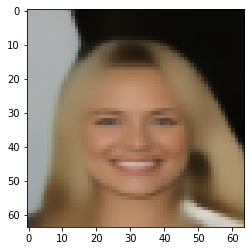

mes_loss: 0.054407134652137756
img:


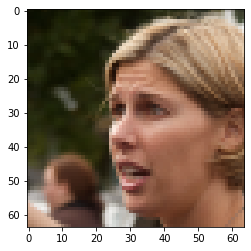

img_recon:


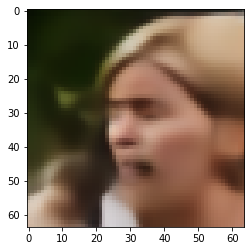

mes_loss: 0.1037943959236145
img:


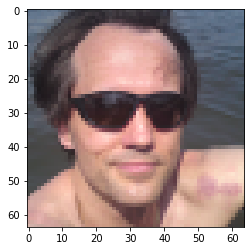

img_recon:


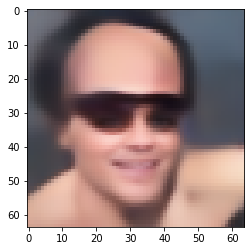

mes_loss: 0.08369074761867523
img:


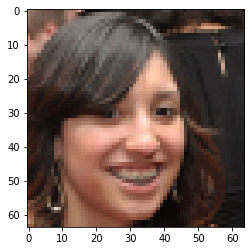

img_recon:


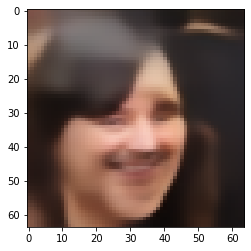

mes_loss: 0.09179744124412537
img:


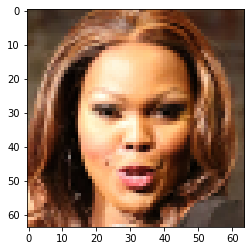

img_recon:


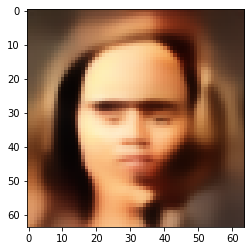

mes_loss: 0.14611822366714478
img:


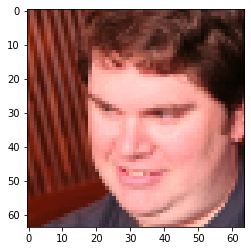

img_recon:


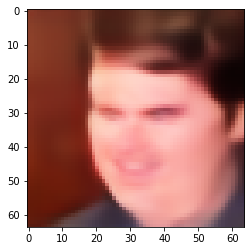

mes_loss: 0.10420189797878265
img:


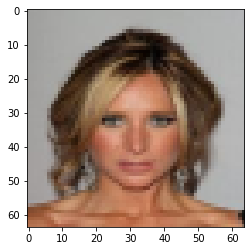

img_recon:


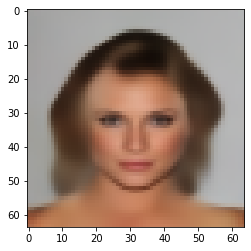

mes_loss: 0.06104108691215515
img:


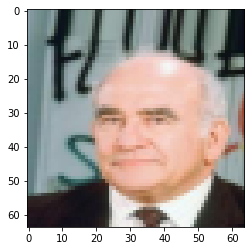

img_recon:


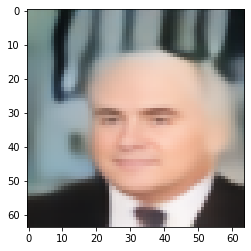

mes_loss: 0.10010971873998642
img:


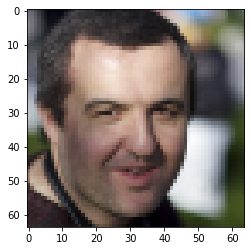

img_recon:


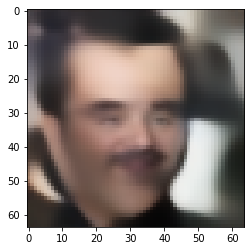

mes_loss: 0.10264983773231506
img:


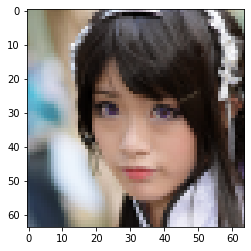

img_recon:


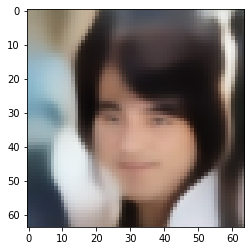

mes_loss: 0.12759576737880707
img:


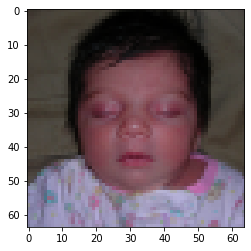

img_recon:


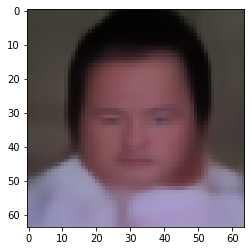

mes_loss: 0.05593595653772354
img:


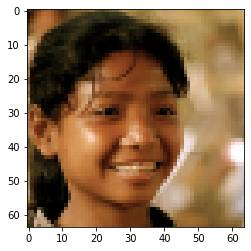

img_recon:


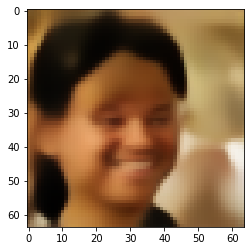

mes_loss: 0.09619898349046707
img:


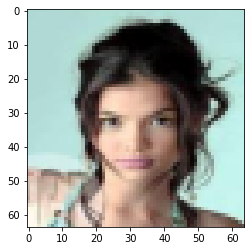

img_recon:


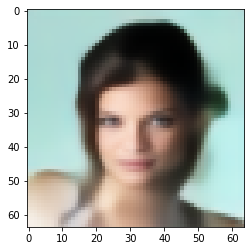

mes_loss: 0.09231077134609222
img:


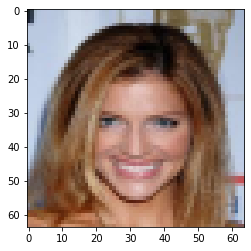

img_recon:


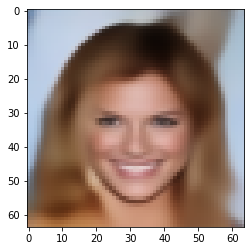

mes_loss: 0.08448326587677002
img:


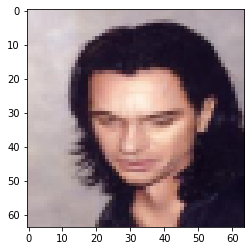

img_recon:


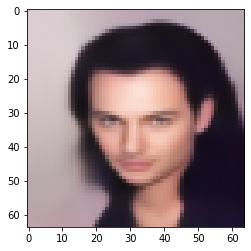

mes_loss: 0.05628712847828865
img:


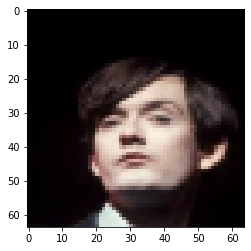

img_recon:


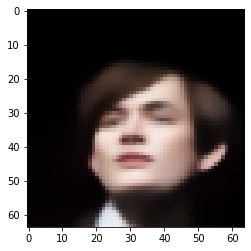

mes_loss: 0.048579927533864975
img:


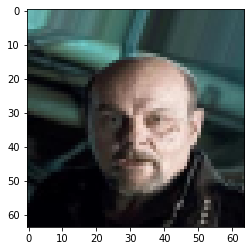

img_recon:


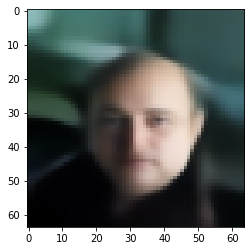

mes_loss: 0.07663396745920181
img:


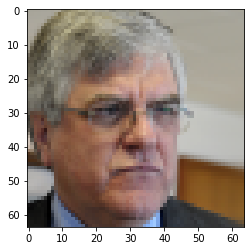

img_recon:


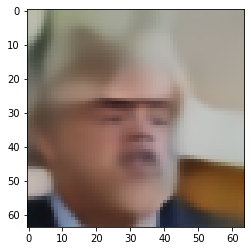

mes_loss: 0.08815115690231323
img:


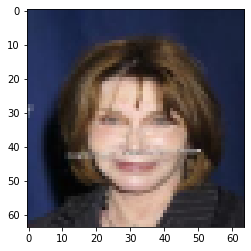

img_recon:


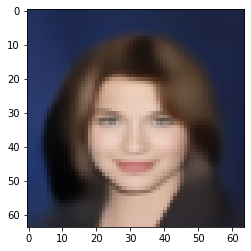

mes_loss: 0.059324439615011215
img:


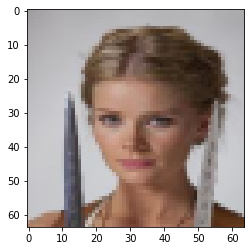

img_recon:


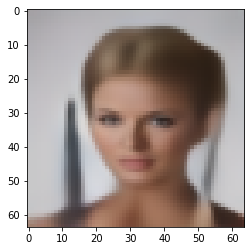

mes_loss: 0.05976784601807594
img:


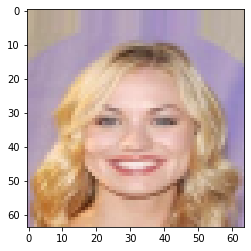

img_recon:


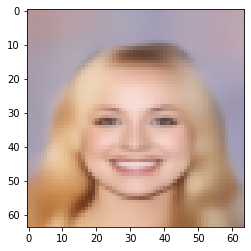

mes_loss: 0.074883833527565
img:


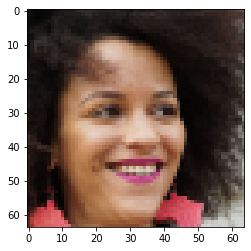

img_recon:


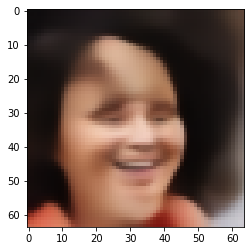

mes_loss: 0.08573676645755768
img:


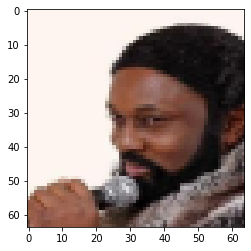

img_recon:


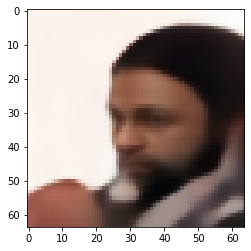

mes_loss: 0.07410974055528641
img:


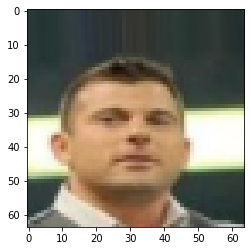

img_recon:


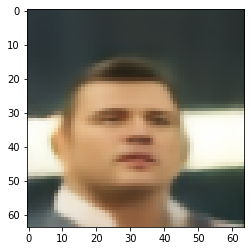

mes_loss: 0.05596759542822838
img:


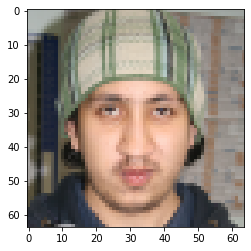

img_recon:


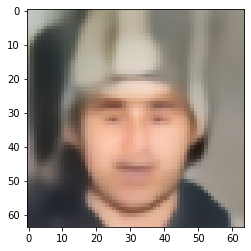

mes_loss: 0.11148755997419357
img:


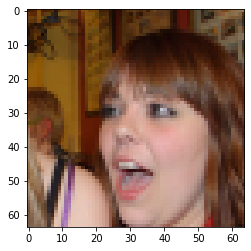

img_recon:


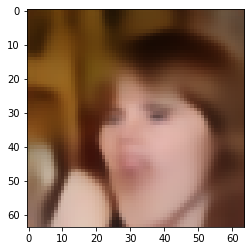

mes_loss: 0.095537930727005
img:


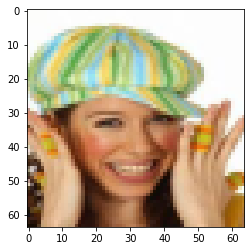

img_recon:


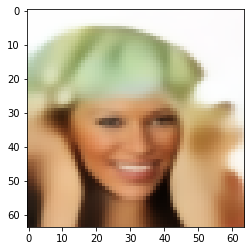

mes_loss: 0.11876889318227768
img:


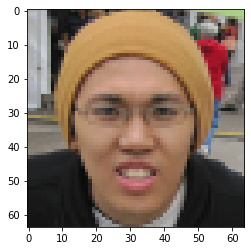

img_recon:


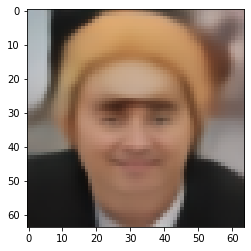

mes_loss: 0.10435829311609268
img:


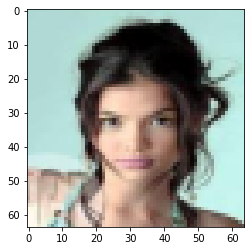

img_recon:


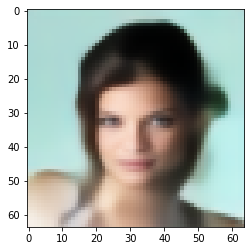

mes_loss: 0.09231077134609222
img:


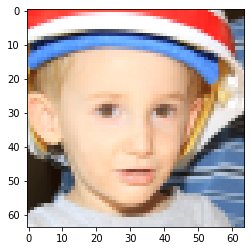

img_recon:


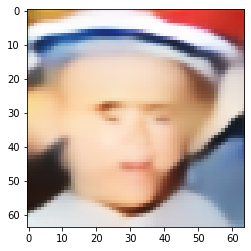

mes_loss: 0.17494294047355652
img:


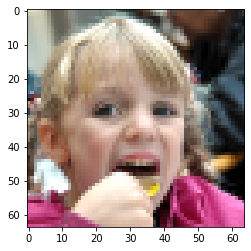

img_recon:


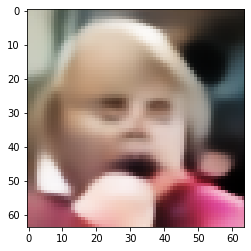

mes_loss: 0.16327443718910217
img:


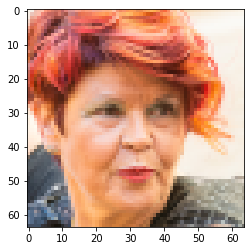

img_recon:


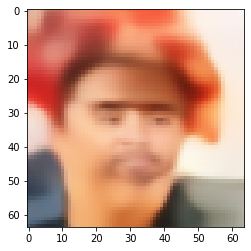

mes_loss: 0.1355552226305008
img:


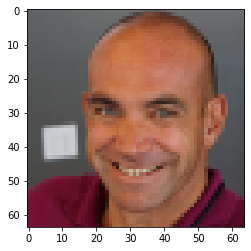

img_recon:


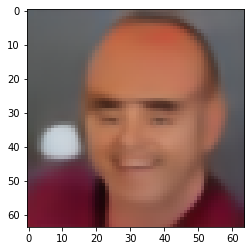

mes_loss: 0.07065047323703766
img:


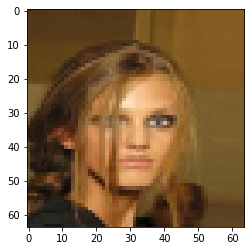

img_recon:


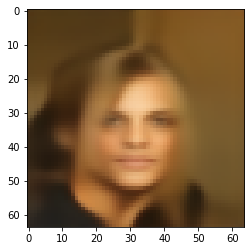

mes_loss: 0.06374099105596542
img:


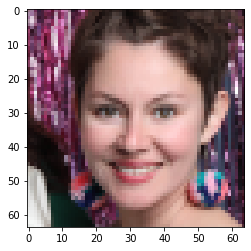

img_recon:


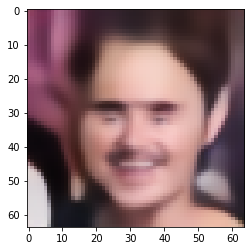

mes_loss: 0.14214003086090088
img:


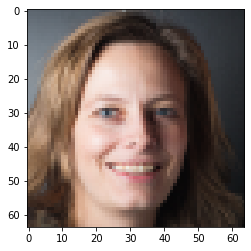

img_recon:


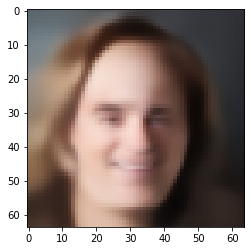

mes_loss: 0.07438286393880844
img:


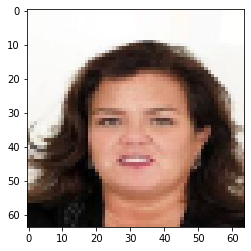

img_recon:


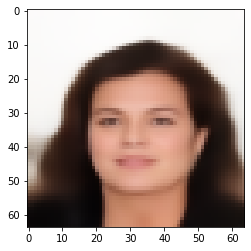

mes_loss: 0.05788697674870491
img:


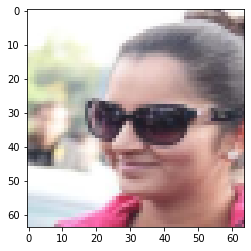

img_recon:


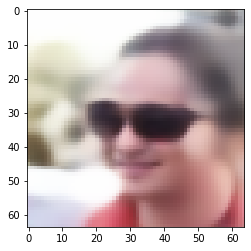

mes_loss: 0.09643460810184479
img:


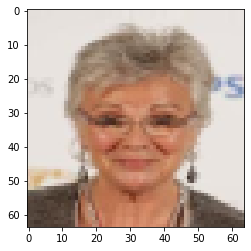

img_recon:


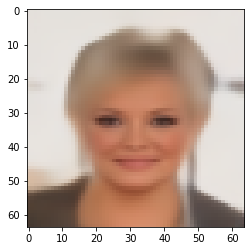

mes_loss: 0.0616067498922348
img:


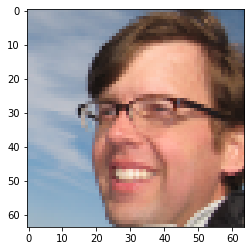

img_recon:


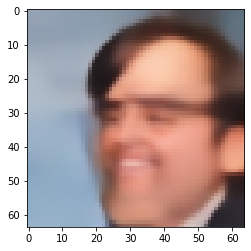

mes_loss: 0.09099607169628143
img:


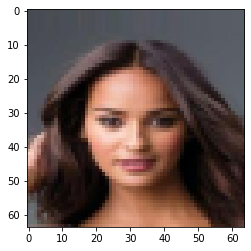

img_recon:


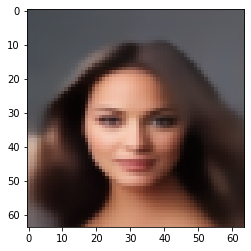

mes_loss: 0.053109828382730484
img:


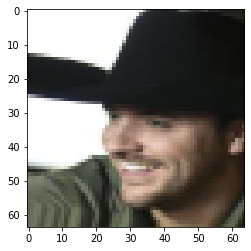

img_recon:


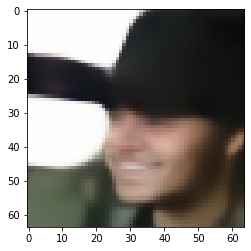

mes_loss: 0.07144574820995331
img:


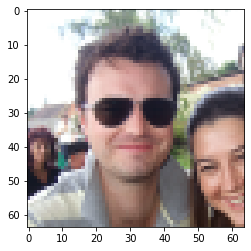

img_recon:


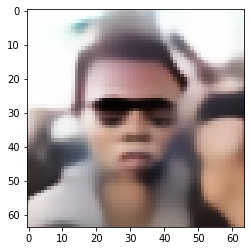

mes_loss: 0.1587219387292862
img:


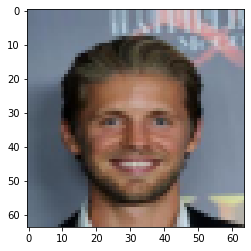

img_recon:


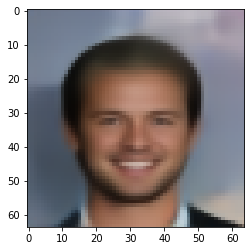

mes_loss: 0.06492552906274796
img:


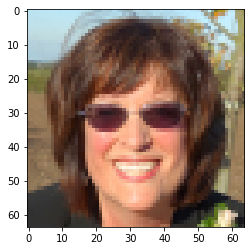

img_recon:


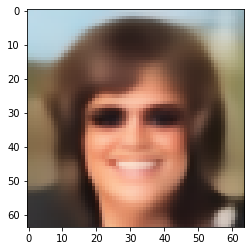

mes_loss: 0.1036347821354866
img:


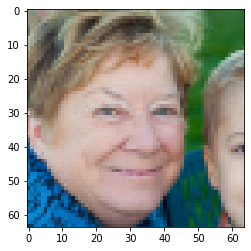

img_recon:


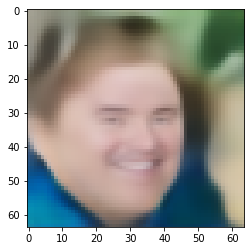

mes_loss: 0.10964322835206985
img:


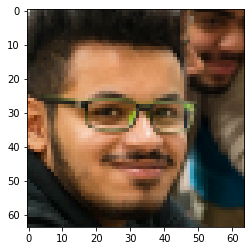

img_recon:


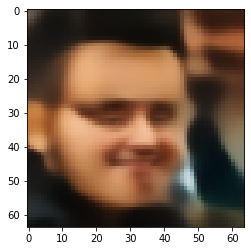

mes_loss: 0.10884147882461548
img:


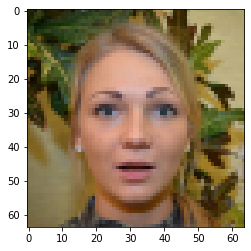

img_recon:


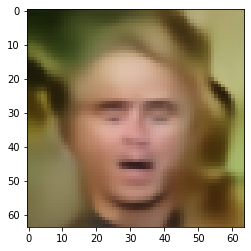

mes_loss: 0.12281869351863861
img:


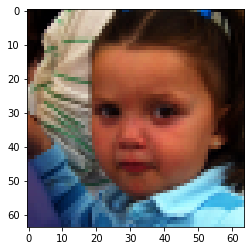

img_recon:


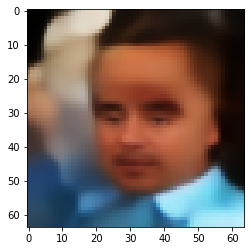

mes_loss: 0.11942895501852036
img:


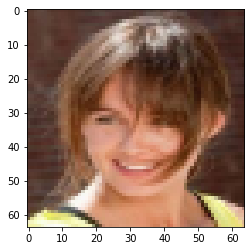

img_recon:


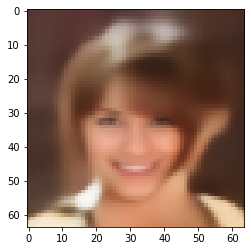

mes_loss: 0.08669585734605789
img:


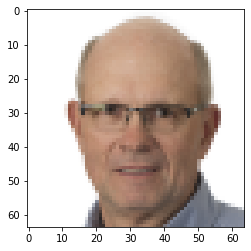

img_recon:


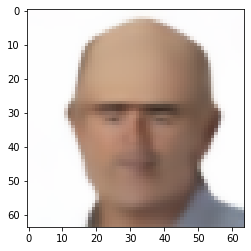

mes_loss: 0.05029820278286934
img:


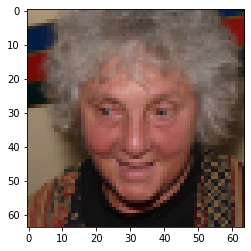

img_recon:


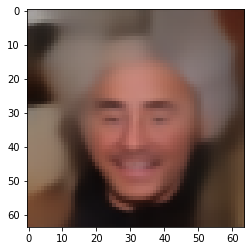

mes_loss: 0.08460544794797897
img:


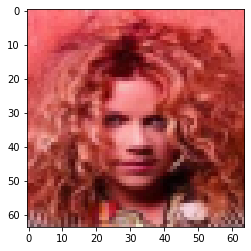

img_recon:


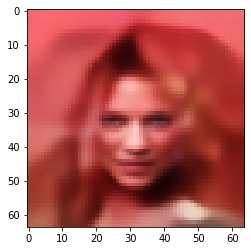

mes_loss: 0.12747612595558167


In [78]:
    # ===================show_img=====================
    model.eval()
    with torch.no_grad():
        for i in range(100):
            idx = random.randint(0, 19999)
            img, img_noise = test_dataset[idx]

            img = img.reshape(1, img.shape[0], img.shape[1], img.shape[2])
            img = img.float().cuda()

            img_noise = img_noise.reshape(1, img_noise.shape[0], img_noise.shape[1], img_noise.shape[2])
            img_noise = img_noise.float().cuda()

            loss = model.loss(img, img_noise).item()

            img_recon = model(img_noise)
            # img_recon_recon = model(img_recon)

            img = img.reshape(img.shape[1], img.shape[2], img.shape[3])
            img = img.cpu()

            # img_noise = img_noise.reshape(img_noise.shape[1], img_noise.shape[2], img_noise.shape[3])
            # img_noise = img_noise.cpu()

            img_recon = img_recon.reshape(img_recon.shape[1], img_recon.shape[2], img_recon.shape[3])
            img_recon = img_recon.cpu()

            # img_recon_recon = img_recon_recon.reshape(img_recon_recon.shape[1], img_recon_recon.shape[2], img_recon_recon.shape[3])
            # img_recon_recon = img_recon_recon.cpu()

            # show original photo
            print('img:')
            show_img(img*0.5+0.5)

            # # show noised photo
            # print('img_noise:')
            # show_img(img_noise*0.5+0.5)

            # show reconstructive photo
            print('img_recon:')
            show_img(img_recon*0.5+0.5)

            # # show rereconstructive photo
            # print('img_recon_recon:')
            # show_img(img_recon_recon*0.5+0.5)

            print(f'mes_loss: {loss}')

In [79]:
    
anomality = list()
with torch.no_grad():
  for i, (img, img_noise) in enumerate(test_dataloader):
        img, img_noise = img.float().cuda(), img_noise.float().cuda()
        loss = model.loss(img, img_noise)
        anomality.append(loss)
anomality = [loss.item() for loss in anomality]

df = pd.DataFrame(anomality, columns=['Predicted'])
df.to_csv(out_file, index_label = 'Id')



# Training statistics
- Number of parameters
- Training time on colab
- Training curve of the bossbaseline model

- Simple
 - Number of parameters: 3176419
 - Training time on colab: ~ 30 min
- Medium
 - Number of parameters: 47355
 - Training time on colab: ~ 30 min
- Strong
 - Number of parameters: 47595
 - Training time on colab:  4 ~ 5 hrs
- Boss:  
 - Number of parameters: 4364140
 - Training time on colab: 1.5~3 hrs

 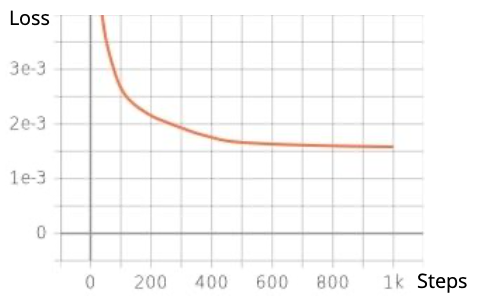
